*Dataset from UCI machine learning repository official website*

- Importing necessary libraries 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import RandomOverSampler # type: ignore

- reading data from the dataset

In [2]:
pd.read_csv('magic04.data')

,28.7967,16.0021,2.6449,0.3918,0.1982,27.7004,22.011,-8.2027,40.092,81.8828,g
0,31.6036,11.7235,2.5185,0.5303,0.3773,26.2722,23.8238,-9.9574,6.3609,205.2610,g
1,162.0520,136.0310,4.0612,0.0374,0.0187,116.7410,-64.8580,-45.2160,76.9600,256.7880,g
2,23.8172,9.5728,2.3385,0.6147,0.3922,27.2107,-6.4633,-7.1513,10.4490,116.7370,g
3,75.1362,30.9205,3.1611,0.3168,0.1832,-5.5277,28.5525,21.8393,4.6480,356.4620,g
4,51.6240,21.1502,2.9085,0.2420,0.1340,50.8761,43.1887,9.8145,3.6130,238.0980,g
...,...,...,...,...,...,...,...,...,...,...,...
19014,21.3846,10.9170,2.6161,0.5857,0.3934,15.2618,11.5245,2.8766,2.4229,106.8258,h
19015,28.9452,6.7020,2.2672,0.5351,0.2784,37.0816,13.1853,-2.9632,86.7975,247.4560,h
19016,75.4455,47.5305,3.4483,0.1417,0.0549,-9.3561,41.0562,-9.4662,30.2987,256.5166,h
19017,120.5135,76.9018,3.9939,0.0944,0.0683,5.8043,-93.5224,-63.8389,84.6874,408.3166,h


- structuring the data set and also adding columns as mention in description of dataset

In [3]:
cols = ['fLength', 'fWidth', 'fSize', 'fConc', 'fConc1', 'fAsym', 'fM3Long', 'fM3Trans', 'fAlpha', 'fDist', 'class']
df = pd.read_csv('magic04.data', names=cols)
df.head()

,fLength,fWidth,fSize,fConc,fConc1,fAsym,fM3Long,fM3Trans,fAlpha,fDist,class
0,28.7967,16.0021,2.6449,0.3918,0.1982,27.7004,22.0110,-8.2027,40.0920,81.8828,g
1,31.6036,11.7235,2.5185,0.5303,0.3773,26.2722,23.8238,-9.9574,6.3609,205.2610,g
2,162.0520,136.0310,4.0612,0.0374,0.0187,116.7410,-64.8580,-45.2160,76.9600,256.7880,g
3,23.8172,9.5728,2.3385,0.6147,0.3922,27.2107,-6.4633,-7.1513,10.4490,116.7370,g
4,75.1362,30.9205,3.1611,0.3168,0.1832,-5.5277,28.5525,21.8393,4.6480,356.4620,g


- Focusing on Class columnn 

In [4]:
df['class'].unique()

array(['g', 'h'], dtype=object)

- Changing values from char to int for better understanding 
g = 0 , h = 1 or vice versa

In [5]:
df['class'] = (df['class'] == 'g').astype(int)

In [6]:
df


,fLength,fWidth,fSize,fConc,fConc1,fAsym,fM3Long,fM3Trans,fAlpha,fDist,class
0,28.7967,16.0021,2.6449,0.3918,0.1982,27.7004,22.0110,-8.2027,40.0920,81.8828,1
1,31.6036,11.7235,2.5185,0.5303,0.3773,26.2722,23.8238,-9.9574,6.3609,205.2610,1
2,162.0520,136.0310,4.0612,0.0374,0.0187,116.7410,-64.8580,-45.2160,76.9600,256.7880,1
3,23.8172,9.5728,2.3385,0.6147,0.3922,27.2107,-6.4633,-7.1513,10.4490,116.7370,1
4,75.1362,30.9205,3.1611,0.3168,0.1832,-5.5277,28.5525,21.8393,4.6480,356.4620,1
...,...,...,...,...,...,...,...,...,...,...,...
19015,21.3846,10.9170,2.6161,0.5857,0.3934,15.2618,11.5245,2.8766,2.4229,106.8258,0
19016,28.9452,6.7020,2.2672,0.5351,0.2784,37.0816,13.1853,-2.9632,86.7975,247.4560,0
19017,75.4455,47.5305,3.4483,0.1417,0.0549,-9.3561,41.0562,-9.4662,30.2987,256.5166,0
19018,120.5135,76.9018,3.9939,0.0944,0.0683,5.8043,-93.5224,-63.8389,84.6874,408.3166,0


- Plotting histogram of data 

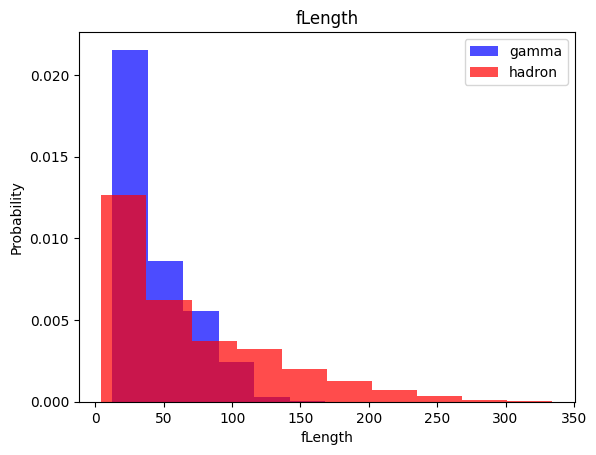

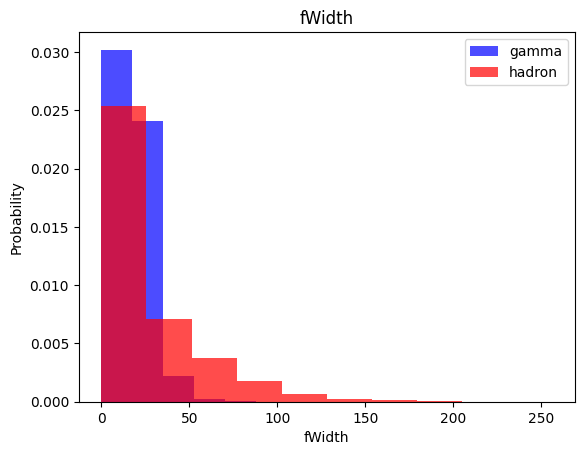

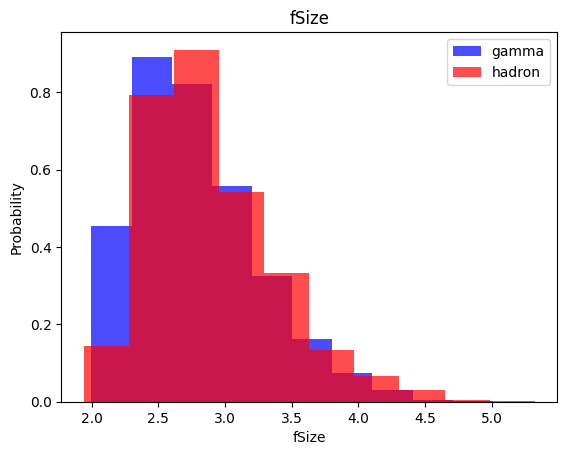

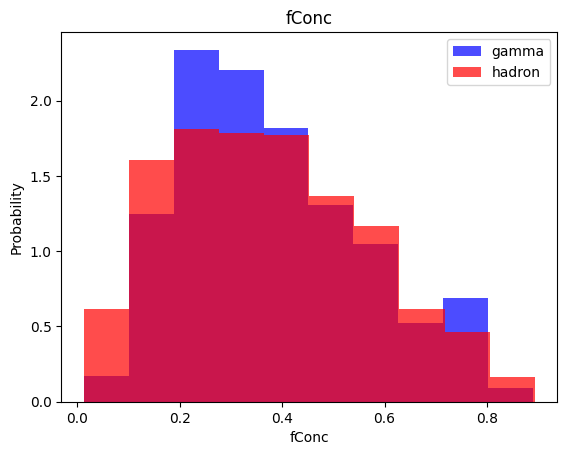

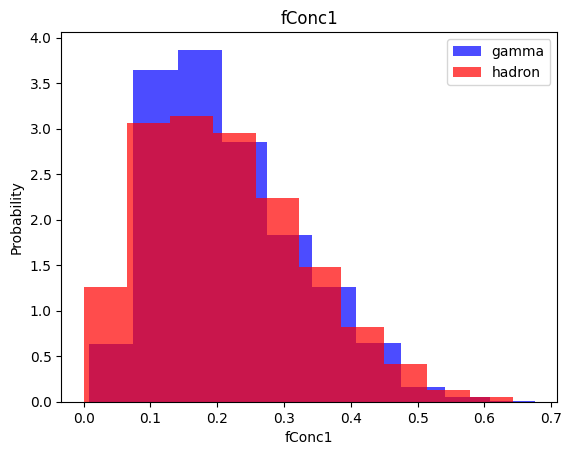

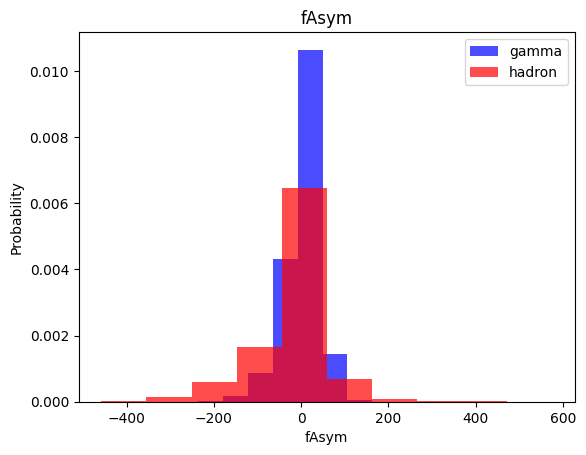

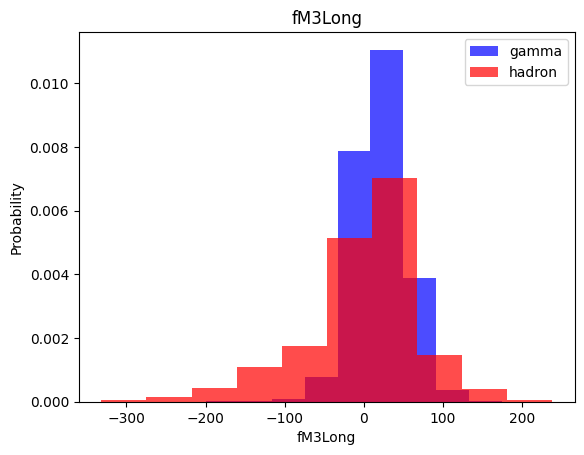

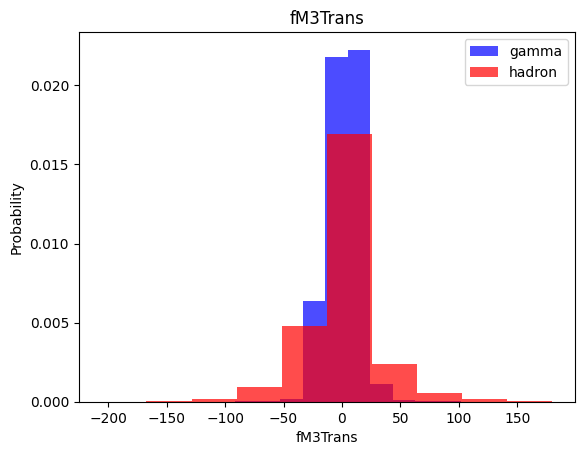

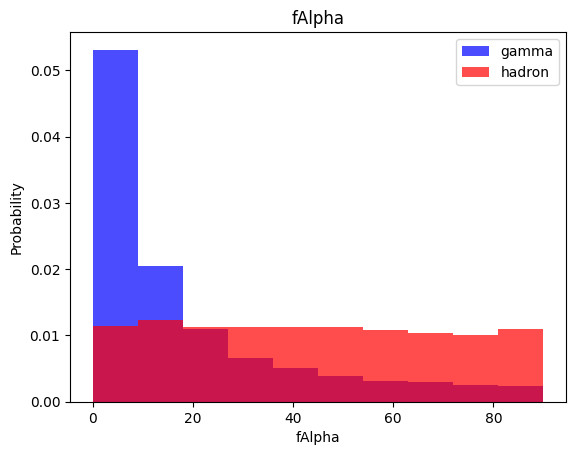

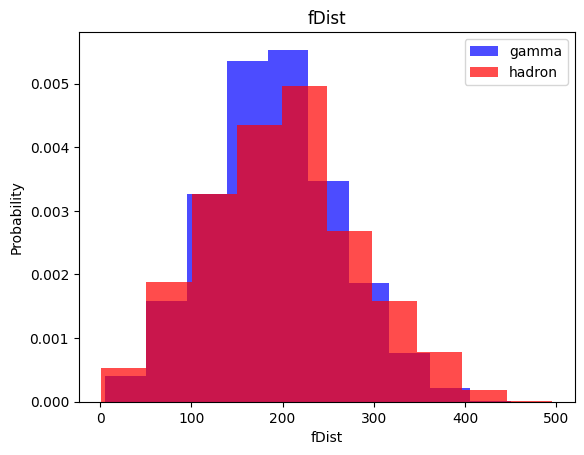

In [7]:
for label in cols[:-1]:
    plt.hist(df[df['class']==1][label], color='blue', alpha=0.7, label='gamma', density=True)
    plt.hist(df[df['class']==0][label], color='red', alpha=0.7, label='hadron', density=True)
    plt.title(label)
    plt.xlabel(label)
    plt.ylabel('Probability')
    plt.legend()
    plt.show()

## Now train , validation and test datasets

In [8]:
# Normalize the data
train , valid , test = np.split(df.sample(frac=1), [int(.6*len(df)), int(.8*len(df))])
 

c:\Users\Vaibhav\Desktop\Machine Learning\Machine-Learning\ml_env\lib\site-packages\numpy\_core\fromnumeric.py:57: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


In [9]:
def scale_dataset(dataframe, oversample=False):
    x = dataframe[dataframe.columns[:-1]].values
    y = dataframe[dataframe.columns[-1]].values
    # scaling the features to have mean 0 and std 1
    # this is important for the convergence of the model
    scaler = StandardScaler()
    x = scaler.fit_transform(x)
    # creating a 2D array with the last column as y
    # and the rest as x
    # we need to reshape y to make it a 2D array
    # so that we can use hstack to combine them  

    if oversample:
        ros = RandomOverSampler()
        x, y = ros.fit_resample(x, y)

    data = np.hstack((x, np.reshape(y, (-1, 1))))
    return data , x , y

In [10]:
train

,fLength,fWidth,fSize,fConc,fConc1,fAsym,fM3Long,fM3Trans,fAlpha,fDist,class
15713,76.7226,11.2998,3.1154,0.2415,0.1453,47.9904,-26.6326,-9.1747,45.4220,100.238,0
7008,68.6372,35.1914,3.2819,0.1609,0.0807,15.9256,47.8220,-37.1380,2.2450,250.332,1
16026,27.1686,10.3316,2.7701,0.5671,0.2844,31.1734,22.8872,-11.8885,26.8100,185.796,0
1448,98.0245,22.3316,3.5637,0.1797,0.0916,36.9658,95.7514,7.1044,1.4470,270.990,1
10114,43.1231,20.8528,2.8960,0.2122,0.1061,67.8101,15.3768,-14.3248,10.9220,145.513,1
...,...,...,...,...,...,...,...,...,...,...,...
6833,88.9941,25.2279,3.5759,0.1567,0.0848,59.5501,82.8117,8.5703,0.3521,304.885,1
316,38.5250,28.8308,3.0257,0.2375,0.1513,15.7854,11.6545,-18.0274,2.3112,119.196,1
18585,29.9501,12.3647,2.5384,0.4428,0.2793,19.2951,24.5753,-3.3277,43.1345,128.399,0
8960,47.3034,16.5317,3.0398,0.2673,0.1382,48.5697,26.4670,-8.3448,17.2617,169.897,1


In [11]:
print(len(train[train['class'] == 1])) # gamma
print(len(train[train['class'] == 0])) # hadron

7369
4043


In [12]:
# train , x_train , y_train = scale_dataset(train, oversample=True)

In [13]:
# len(y_train)

In [14]:
# sum(y_train == 1) # gamma
# sum(y_train == 0) # hadron

In [15]:
# sum(y_train == 0) # hadron

In [16]:
train , x_train , y_train = scale_dataset(train, oversample=True)
valid , x_valid , y_valid = scale_dataset(valid, oversample=False)
test , x_test , y_test = scale_dataset(test, oversample=False)

# KNN (K-nearest neighbors)

In [17]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report

In [18]:
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(x_train, y_train)

KNeighborsClassifier()

In [19]:
y_pred = knn_model.predict(x_test)

In [20]:
y_pred

array([1, 1, 1, ..., 1, 1, 1])

In [21]:
y_test

array([1, 1, 1, ..., 1, 1, 1])

In [22]:
print(classification_report(y_test, y_pred, target_names=['hadron', 'gamma']))

              precision    recall  f1-score   support

      hadron       0.73      0.75      0.74      1312
       gamma       0.87      0.86      0.86      2492

    accuracy                           0.82      3804
   macro avg       0.80      0.80      0.80      3804
weighted avg       0.82      0.82      0.82      3804



# Naive Bayes

In [ ]:
from sklearn.naive_bayes import GaussianNB

In [ ]:
nb_model = GaussianNB()
nb_model = nb_model.fit(x_train, y_train)

In [ ]:
y_pred = nb_model.predict(x_test)
print(classification_report(y_test, y_pred, target_names=['hadron', 'gamma']))

              precision    recall  f1-score   support

      hadron       0.67      0.41      0.51      1312
       gamma       0.74      0.89      0.81      2492

    accuracy                           0.73      3804
   macro avg       0.71      0.65      0.66      3804
weighted avg       0.72      0.73      0.71      3804



# Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lg_model = LogisticRegression()
lg_model = lg_model.fit(x_train, y_train)

In [ ]:
y_pred = lg_model.predict(x_test)
print(classification_report(y_test, y_pred, target_names=['hadron', 'gamma']))

              precision    recall  f1-score   support

      hadron       0.67      0.72      0.70      1312
       gamma       0.85      0.82      0.83      2492

    accuracy                           0.78      3804
   macro avg       0.76      0.77      0.76      3804
weighted avg       0.79      0.78      0.78      3804



## Support Vector Machine (SVM)

In [ ]:
from sklearn.svm import SVC

In [ ]:
svm_model = SVC()
svm_model = svm_model.fit(x_train, y_train)

In [ ]:
y_pred = lg_model.predict(x_test)
print(classification_report(y_test, y_pred, target_names=['hadron', 'gamma']))

              precision    recall  f1-score   support

      hadron       0.67      0.72      0.70      1312
       gamma       0.85      0.82      0.83      2492

    accuracy                           0.78      3804
   macro avg       0.76      0.77      0.76      3804
weighted avg       0.79      0.78      0.78      3804



## Tensorflow Classification Of NN 


In [ ]:
import tensorflow as tf

In [ ]:
def plot_history(history):
    fig , (ax1 , ax2) = plt.subplots(1, 2, figsize=(15, 5))
    ax1.plot(history.history['loss'], label='train loss')
    ax1.plot(history.history['val_loss'], label='validation loss')
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Binary Crossentropy')
    ax1.legend()
    ax1.grid(True)

    ax2.plot(history.history['accuracy'], label='train accuracy')
    ax2.plot(history.history['val_accuracy'], label='validation accuracy')
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('Accuracy')
    ax2.legend()
    ax2.grid(True)

    plt.show()


In [ ]:
plot_history(history)

NameError: name 'history' is not defined

In [ ]:
def train_model(x_train,y_train,num_nodes,dropout_prob,lr,batch_size,epochs):
    nn_model = tf.keras.Sequential(
        [
            tf.keras.layers.Dense(num_nodes,activation='relu', input_shape=(10,)),
            tf.keras.layers.Dropout(dropout_prob),
            tf.keras.layers.Dense(num_nodes,activation='relu'),
            tf.keras.layers.Dropout(dropout_prob),
            tf.keras.layers.Dense(1,activation='sigmoid')
        ]
    )
    nn_model.compile(
    optimizer=tf.keras.optimizers.Adam(lr),
    loss='binary_crossentropy',
    metrics=['accuracy']
    )
    history = nn_model.fit(
        x_train, y_train,
        batch_size=batch_size,
        epochs=epochs,
        validation_split=0.2,
        verbose=1
    )
    return nn_model, history

Epoch 1/100


c:\Users\Vaibhav\Desktop\Machine Learning\Machine-Learning\ml_env\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


740/740 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.7571 - loss: 0.4984 - val_accuracy: 0.7108 - val_loss: 0.7498
Epoch 2/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8222 - loss: 0.4522 - val_accuracy: 0.7557 - val_loss: 0.5073
Epoch 3/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8339 - loss: 0.4054 - val_accuracy: 0.7824 - val_loss: 0.4388
Epoch 4/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8390 - loss: 0.3918 - val_accuracy: 0.6243 - val_loss: 0.9430
Epoch 5/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8301 - loss: 0.4040 - val_accuracy: 0.7220 - val_loss: 0.5109
Epoch 6/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8382 - loss: 0.3892 - val_accuracy: 0.5780 - val_loss: 0.8823
Epoch 7/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8275 - loss: 0.4051 - val_accuracy: 0.7696 - val_loss: 0.4833
Epoch 8/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8414 - loss: 0.3934 - val_accuracy: 0.7520

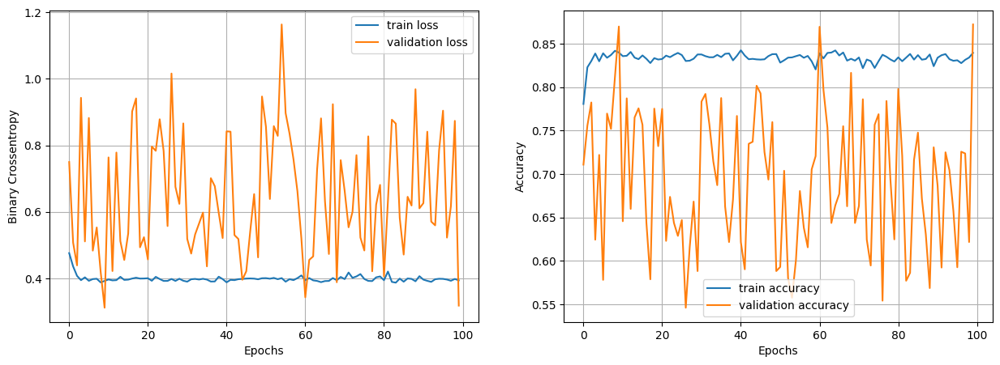

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8000 - loss: 0.4509  
Epoch 1/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7767 - loss: 0.4685 - val_accuracy: 0.5463 - val_loss: 0.7380
Epoch 2/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8151 - loss: 0.4247 - val_accuracy: 0.6493 - val_loss: 0.6625
Epoch 3/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8508 - loss: 0.3658 - val_accuracy: 0.6662 - val_loss: 0.5820
Epoch 4/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8498 - loss: 0.3568 - val_accuracy: 0.7176 - val_loss: 0.4527
Epoch 5/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8512 - loss: 0.3570 - val_accuracy: 0.5973 - val_loss: 0.7951
Epoch 6/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8443 - loss: 0.3737 - val_accuracy: 0.6233 - val_loss: 0.6543
Epoch 7/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8448 - loss: 0.3730 - val_accuracy: 0.7757 - val_loss: 0.3686
Epoch 8/100
370/370 

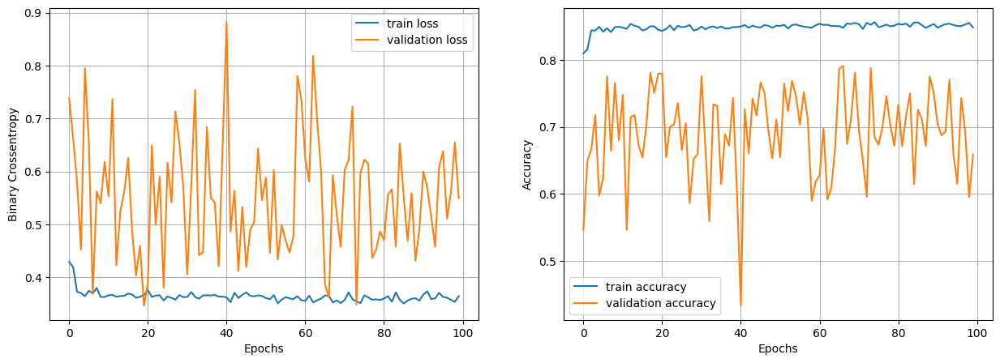

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8586 - loss: 0.3763  
Epoch 1/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7806 - loss: 0.4624 - val_accuracy: 0.6230 - val_loss: 0.5931
Epoch 2/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8287 - loss: 0.3893 - val_accuracy: 0.6990 - val_loss: 0.5264
Epoch 3/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8489 - loss: 0.3576 - val_accuracy: 0.7236 - val_loss: 0.5164
Epoch 4/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8478 - loss: 0.3571 - val_accuracy: 0.6912 - val_loss: 0.6303
Epoch 5/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8486 - loss: 0.3574 - val_accuracy: 0.5980 - val_loss: 0.8120
Epoch 6/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8543 - loss: 0.3497 - val_accuracy: 0.7557 - val_loss: 0.4685
Epoch 7/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8527 - loss: 0.3488 - val_accuracy: 0.7399 - val_loss: 0.4779
Epoch 8/100
185/185 

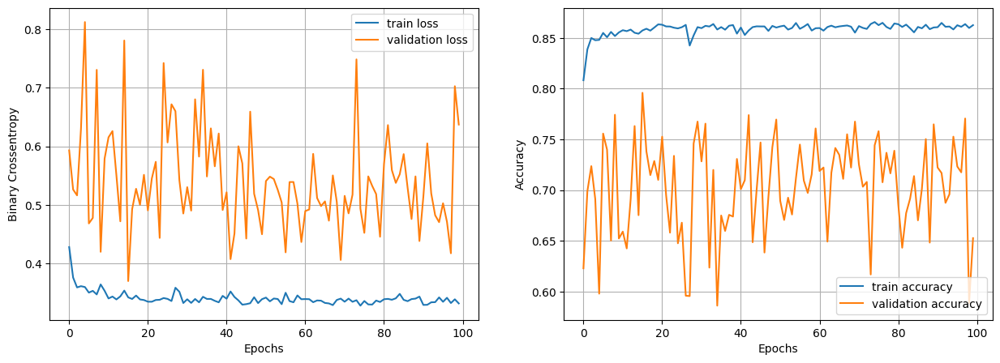

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8691 - loss: 0.3240  
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7619 - loss: 0.5013 - val_accuracy: 0.6740 - val_loss: 0.6085
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8411 - loss: 0.3704 - val_accuracy: 0.6858 - val_loss: 0.5340
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8498 - loss: 0.3590 - val_accuracy: 0.6672 - val_loss: 0.6394
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8515 - loss: 0.3514 - val_accuracy: 0.7264 - val_loss: 0.4790
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8546 - loss: 0.3480 - val_accuracy: 0.7557 - val_loss: 0.4397
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8551 - loss: 0.3468 - val_accuracy: 0.6595 - val_loss: 0.6622
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8563 - loss: 0.3483 - val_accuracy: 0.7338 - val_loss: 0.5160
Epoch 8/100
93/93 ━━━━━━━━━━━━━━━━

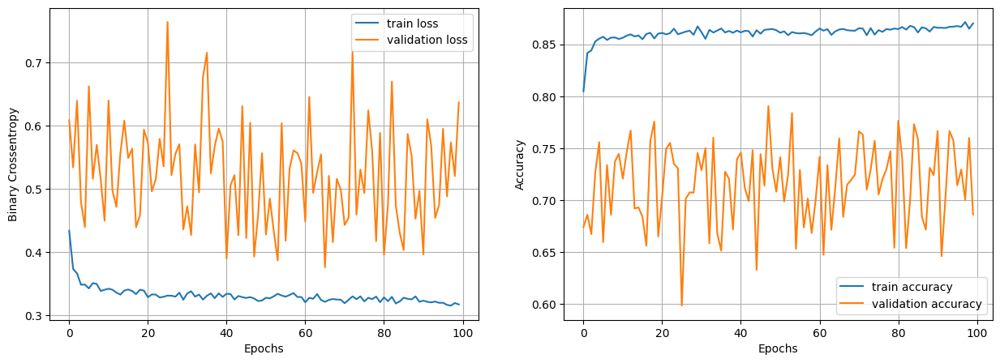

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8782 - loss: 0.3142  
Epoch 1/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.7771 - loss: 0.4574 - val_accuracy: 0.6267 - val_loss: 0.7097
Epoch 2/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8448 - loss: 0.3659 - val_accuracy: 0.7443 - val_loss: 0.4742
Epoch 3/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8570 - loss: 0.3353 - val_accuracy: 0.7436 - val_loss: 0.4956
Epoch 4/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8577 - loss: 0.3360 - val_accuracy: 0.7182 - val_loss: 0.5235
Epoch 5/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8629 - loss: 0.3256 - val_accuracy: 0.6628 - val_loss: 0.6647
Epoch 6/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8661 - loss: 0.3165 - val_accuracy: 0.7014 - val_loss: 0.5511
Epoch 7/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8665 - loss: 0.3248 - val_accuracy: 0.7372 - val_loss: 0.5163
Epoch 8/100
740/740 

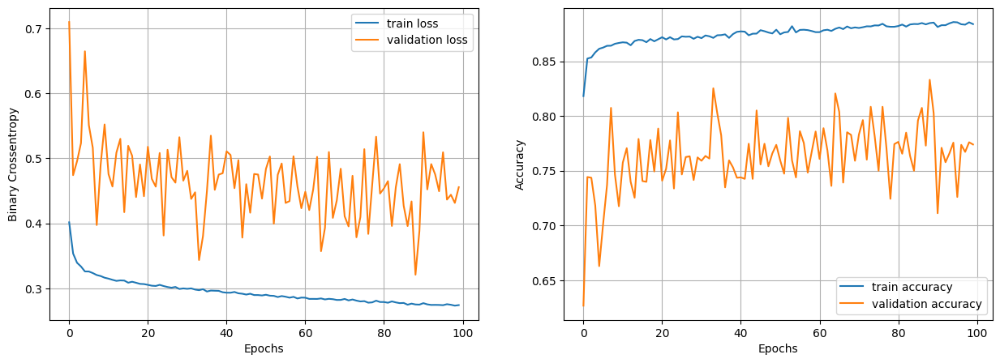

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8736 - loss: 0.3195
Epoch 1/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7869 - loss: 0.4591 - val_accuracy: 0.7135 - val_loss: 0.5837
Epoch 2/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8548 - loss: 0.3492 - val_accuracy: 0.7061 - val_loss: 0.5443
Epoch 3/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8570 - loss: 0.3427 - val_accuracy: 0.7720 - val_loss: 0.4228
Epoch 4/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8618 - loss: 0.3336 - val_accuracy: 0.7436 - val_loss: 0.4811
Epoch 5/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8658 - loss: 0.3226 - val_accuracy: 0.7007 - val_loss: 0.5512
Epoch 6/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8584 - loss: 0.3302 - val_accuracy: 0.7307 - val_loss: 0.5108
Epoch 7/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8654 - loss: 0.3222 - val_accuracy: 0.7216 - val_loss: 0.5351
Epoch 8/100
370/370 ━━

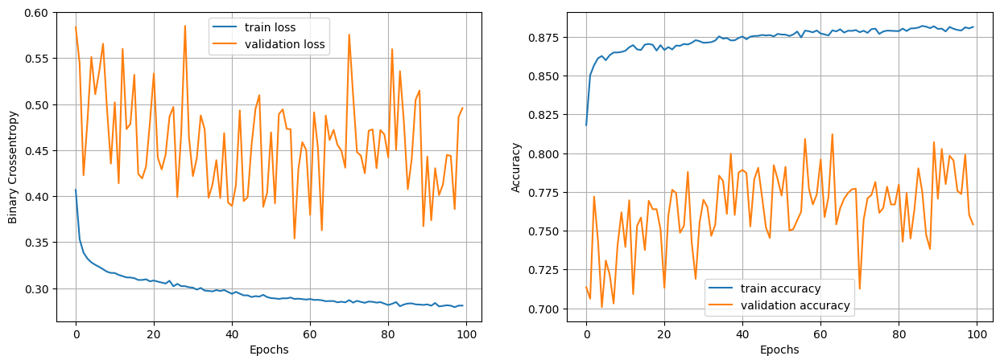

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8730 - loss: 0.3091
Epoch 1/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7854 - loss: 0.4856 - val_accuracy: 0.6544 - val_loss: 0.6315
Epoch 2/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8476 - loss: 0.3580 - val_accuracy: 0.6760 - val_loss: 0.6157
Epoch 3/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8506 - loss: 0.3468 - val_accuracy: 0.6611 - val_loss: 0.6486
Epoch 4/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8516 - loss: 0.3509 - val_accuracy: 0.7743 - val_loss: 0.4395
Epoch 5/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8570 - loss: 0.3281 - val_accuracy: 0.7118 - val_loss: 0.5175
Epoch 6/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8647 - loss: 0.3203 - val_accuracy: 0.7642 - val_loss: 0.4352
Epoch 7/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8578 - loss: 0.3298 - val_accuracy: 0.6973 - val_loss: 0.5813
Epoch 8/100
185/185 ━━

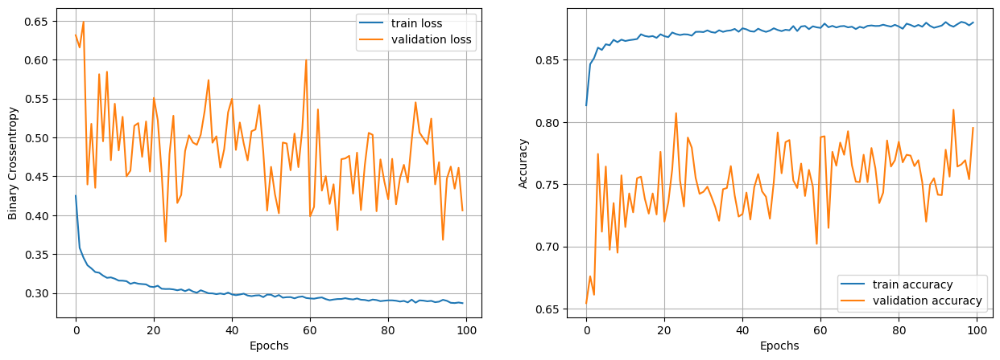

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8721 - loss: 0.3158  
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7081 - loss: 0.6007 - val_accuracy: 0.7206 - val_loss: 0.5268
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8210 - loss: 0.3980 - val_accuracy: 0.6902 - val_loss: 0.6004
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8421 - loss: 0.3621 - val_accuracy: 0.6645 - val_loss: 0.6265
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8515 - loss: 0.3467 - val_accuracy: 0.7392 - val_loss: 0.5005
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8544 - loss: 0.3485 - val_accuracy: 0.7098 - val_loss: 0.5470
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8591 - loss: 0.3344 - val_accuracy: 0.7459 - val_loss: 0.4795
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8601 - loss: 0.3295 - val_accuracy: 0.7098 - val_loss: 0.5341
Epoch 8/100
93/93 ━━━━━━━━━━━━━━━━

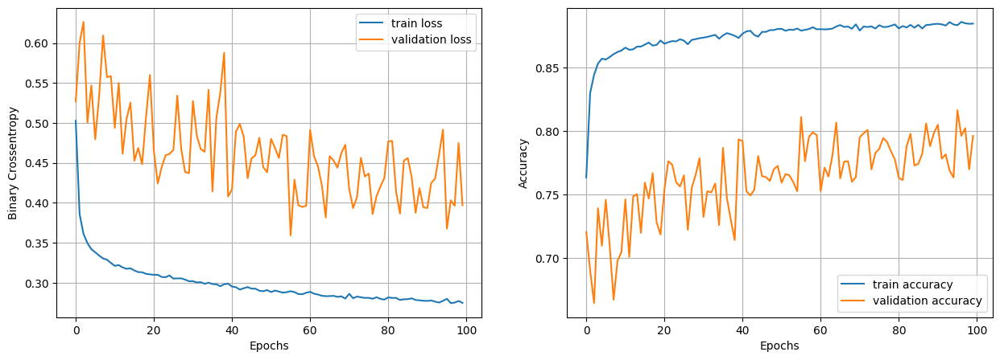

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8833 - loss: 0.2994  
Epoch 1/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7142 - loss: 0.5412 - val_accuracy: 0.6304 - val_loss: 0.6499
Epoch 2/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8188 - loss: 0.4070 - val_accuracy: 0.6659 - val_loss: 0.6047
Epoch 3/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8344 - loss: 0.3864 - val_accuracy: 0.6760 - val_loss: 0.6116
Epoch 4/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8459 - loss: 0.3569 - val_accuracy: 0.7155 - val_loss: 0.5153
Epoch 5/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8541 - loss: 0.3498 - val_accuracy: 0.7365 - val_loss: 0.4979
Epoch 6/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8574 - loss: 0.3365 - val_accuracy: 0.7429 - val_loss: 0.4965
Epoch 7/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8622 - loss: 0.3271 - val_accuracy: 0.7172 - val_loss: 0.5027
Epoch 8/100
740/740 

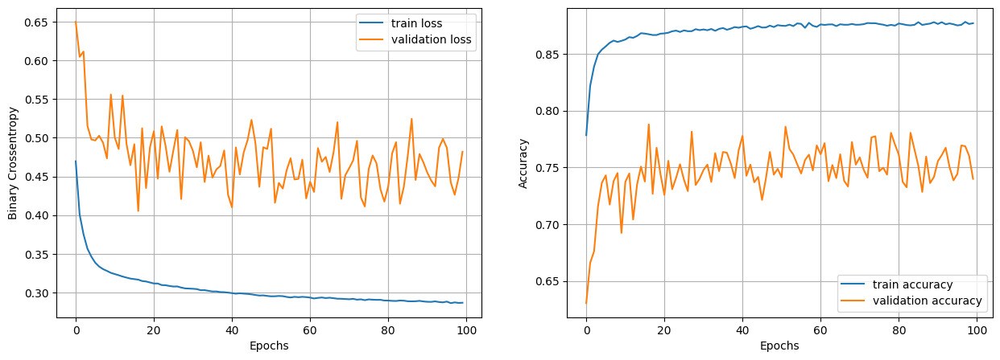

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8824 - loss: 0.3044
Epoch 1/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7111 - loss: 0.5819 - val_accuracy: 0.6101 - val_loss: 0.6428
Epoch 2/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7994 - loss: 0.4286 - val_accuracy: 0.6091 - val_loss: 0.6628
Epoch 3/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8178 - loss: 0.4099 - val_accuracy: 0.6321 - val_loss: 0.6672
Epoch 4/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8324 - loss: 0.3813 - val_accuracy: 0.6645 - val_loss: 0.6054
Epoch 5/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8426 - loss: 0.3758 - val_accuracy: 0.6990 - val_loss: 0.5564
Epoch 6/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8445 - loss: 0.3675 - val_accuracy: 0.7051 - val_loss: 0.5870
Epoch 7/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8560 - loss: 0.3553 - val_accuracy: 0.7054 - val_loss: 0.5606
Epoch 8/100
370/370 ━━

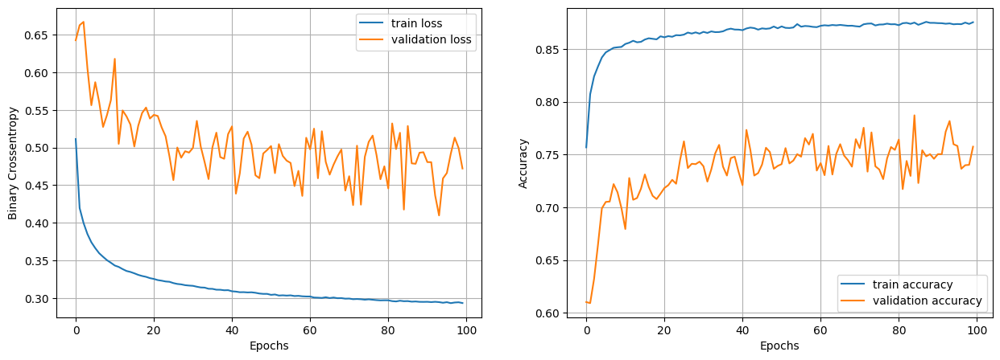

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8835 - loss: 0.2990  
Epoch 1/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6021 - loss: 0.6563 - val_accuracy: 0.5811 - val_loss: 0.6791
Epoch 2/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7946 - loss: 0.4536 - val_accuracy: 0.6247 - val_loss: 0.6439
Epoch 3/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8215 - loss: 0.4049 - val_accuracy: 0.6784 - val_loss: 0.5968
Epoch 4/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8412 - loss: 0.3703 - val_accuracy: 0.6811 - val_loss: 0.5915
Epoch 5/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8520 - loss: 0.3589 - val_accuracy: 0.6959 - val_loss: 0.5754
Epoch 6/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8475 - loss: 0.3594 - val_accuracy: 0.7209 - val_loss: 0.5321
Epoch 7/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8508 - loss: 0.3532 - val_accuracy: 0.6882 - val_loss: 0.5908
Epoch 8/100
185/185 

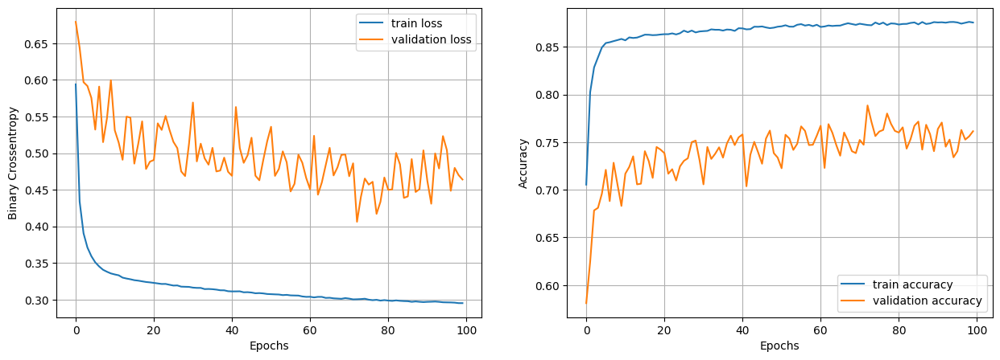

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8865 - loss: 0.2982  
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6924 - loss: 0.6197 - val_accuracy: 0.5534 - val_loss: 0.6779
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7945 - loss: 0.4729 - val_accuracy: 0.6155 - val_loss: 0.6423
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8038 - loss: 0.4265 - val_accuracy: 0.6429 - val_loss: 0.6159
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8180 - loss: 0.4065 - val_accuracy: 0.6480 - val_loss: 0.6093
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8283 - loss: 0.3896 - val_accuracy: 0.6686 - val_loss: 0.5818
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8349 - loss: 0.3773 - val_accuracy: 0.6659 - val_loss: 0.6009
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8398 - loss: 0.3669 - val_accuracy: 0.7139 - val_loss: 0.5388
Epoch 8/100
93/93 ━━━━━━━━━━━━━━━━

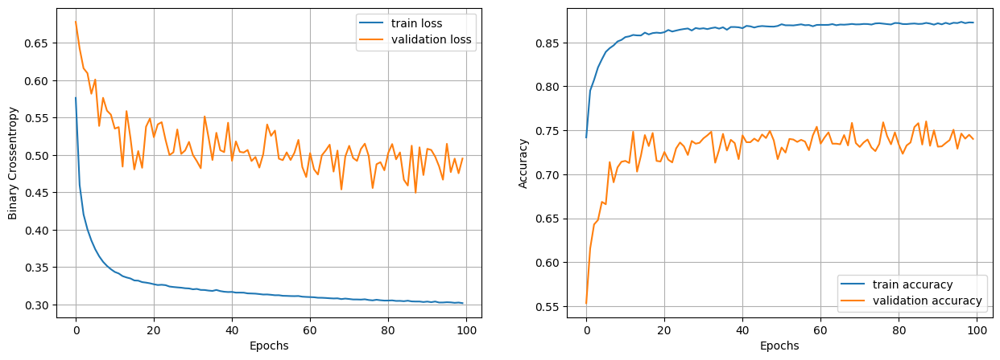

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8813 - loss: 0.3104  
Epoch 1/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.7214 - loss: 0.5628 - val_accuracy: 0.4081 - val_loss: 0.8615
Epoch 2/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7183 - loss: 0.5847 - val_accuracy: 0.1240 - val_loss: 0.9810
Epoch 3/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6566 - loss: 0.6505 - val_accuracy: 0.0014 - val_loss: 0.9921
Epoch 4/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6244 - loss: 0.6650 - val_accuracy: 0.0459 - val_loss: 1.1155
Epoch 5/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6320 - loss: 0.6630 - val_accuracy: 0.0341 - val_loss: 1.2815
Epoch 6/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6567 - loss: 0.6873 - val_accuracy: 0.1949 - val_loss: 0.9957
Epoch 7/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6999 - loss: 0.6011 - val_accuracy: 0.3929 - val_loss: 0.9002
Epoch 8/100
740/740 

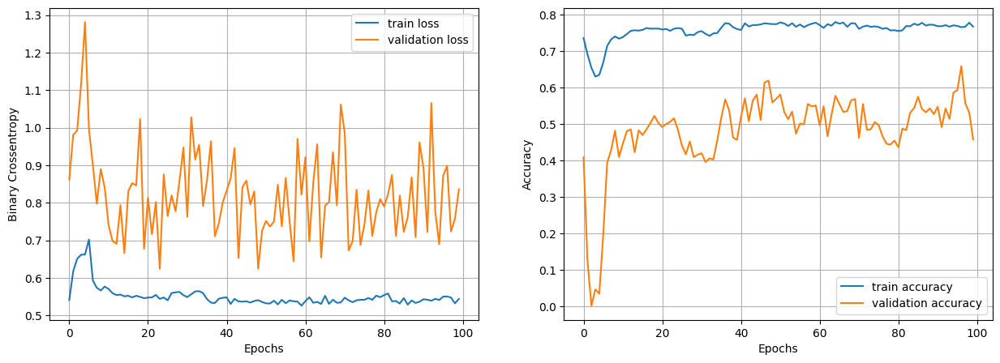

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8045 - loss: 0.4889  
Epoch 1/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7473 - loss: 0.5277 - val_accuracy: 0.3105 - val_loss: 0.8996
Epoch 2/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7599 - loss: 0.5056 - val_accuracy: 0.5554 - val_loss: 0.6195
Epoch 3/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7526 - loss: 0.4790 - val_accuracy: 0.4318 - val_loss: 0.6619
Epoch 4/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7549 - loss: 0.4918 - val_accuracy: 0.5916 - val_loss: 0.5933
Epoch 5/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7740 - loss: 0.4745 - val_accuracy: 0.5466 - val_loss: 0.6774
Epoch 6/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7601 - loss: 0.4855 - val_accuracy: 0.5304 - val_loss: 0.5745
Epoch 7/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7860 - loss: 0.4619 - val_accuracy: 0.6314 - val_loss: 0.5799
Epoch 8/100
370/370 

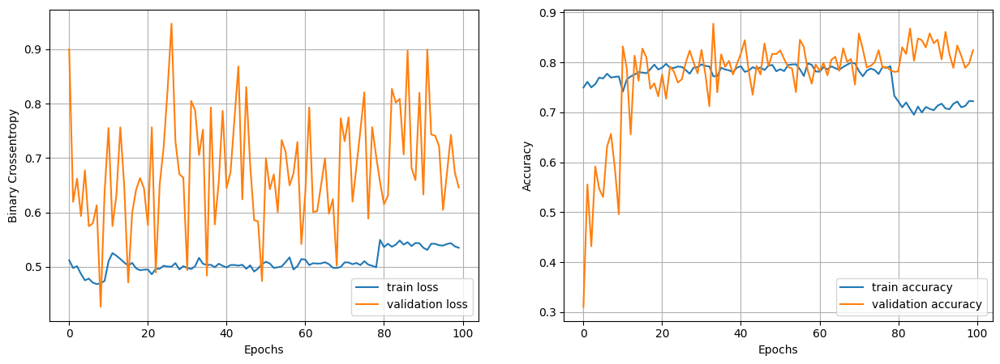

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8044 - loss: 0.4609  
Epoch 1/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7340 - loss: 0.5168 - val_accuracy: 0.6595 - val_loss: 0.5690
Epoch 2/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8122 - loss: 0.4238 - val_accuracy: 0.6412 - val_loss: 0.5371
Epoch 3/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8038 - loss: 0.4317 - val_accuracy: 0.6821 - val_loss: 0.7770
Epoch 4/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8093 - loss: 0.4423 - val_accuracy: 0.7372 - val_loss: 0.5588
Epoch 5/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8008 - loss: 0.4446 - val_accuracy: 0.6497 - val_loss: 0.6095
Epoch 6/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7997 - loss: 0.4535 - val_accuracy: 0.5537 - val_loss: 0.6191
Epoch 7/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7800 - loss: 0.4561 - val_accuracy: 0.5378 - val_loss: 0.6500
Epoch 8/100
185/185 

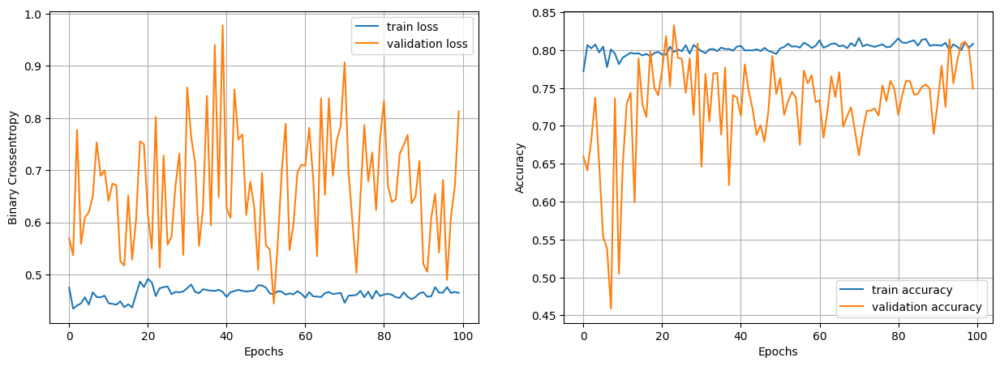

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8346 - loss: 0.4236  
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7631 - loss: 0.4910 - val_accuracy: 0.7358 - val_loss: 0.4333
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8097 - loss: 0.4311 - val_accuracy: 0.5973 - val_loss: 0.7937
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8019 - loss: 0.4357 - val_accuracy: 0.6669 - val_loss: 0.5574
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8232 - loss: 0.4088 - val_accuracy: 0.6172 - val_loss: 0.6129
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8276 - loss: 0.4036 - val_accuracy: 0.7071 - val_loss: 0.5310
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8125 - loss: 0.4275 - val_accuracy: 0.5902 - val_loss: 0.7740
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8143 - loss: 0.4356 - val_accuracy: 0.6557 - val_loss: 0.6256
Epoch 8/100
93/93 ━━━━━━━━━━━━━━━━

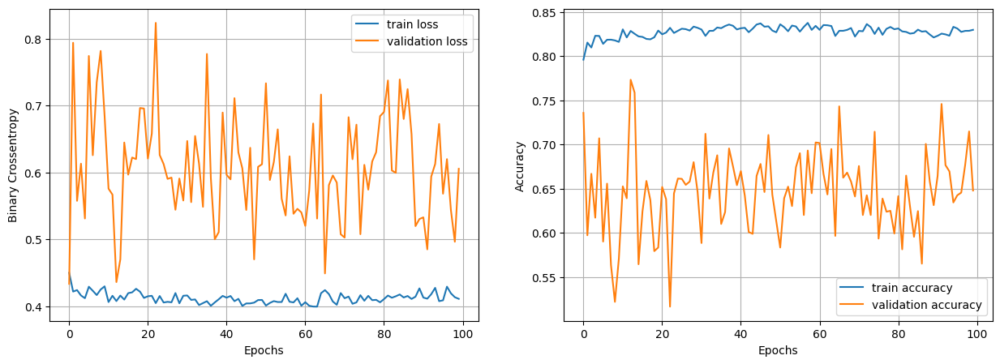

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8668 - loss: 0.3643  
Epoch 1/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7703 - loss: 0.4990 - val_accuracy: 0.7078 - val_loss: 0.5300
Epoch 2/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8306 - loss: 0.3930 - val_accuracy: 0.6760 - val_loss: 0.5994
Epoch 3/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8425 - loss: 0.3747 - val_accuracy: 0.7182 - val_loss: 0.5098
Epoch 4/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8456 - loss: 0.3691 - val_accuracy: 0.6834 - val_loss: 0.6025
Epoch 5/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8545 - loss: 0.3563 - val_accuracy: 0.6618 - val_loss: 0.5709
Epoch 6/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8458 - loss: 0.3708 - val_accuracy: 0.7358 - val_loss: 0.4728
Epoch 7/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8527 - loss: 0.3510 - val_accuracy: 0.6845 - val_loss: 0.5288
Epoch 8/100
740/740 

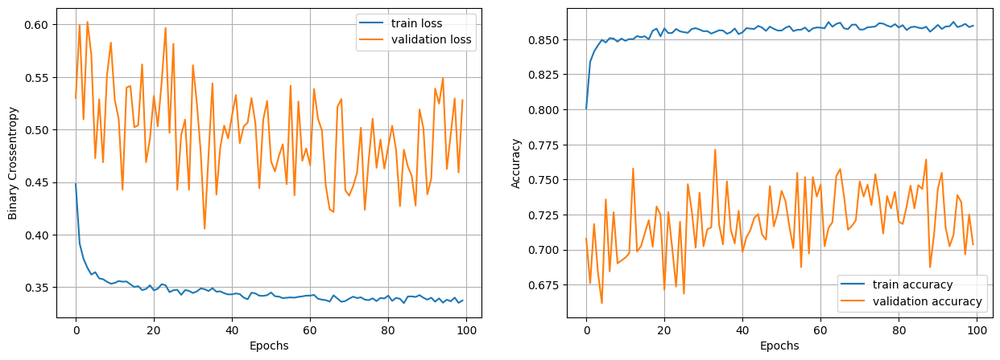

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8761 - loss: 0.3115
Epoch 1/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7344 - loss: 0.5318 - val_accuracy: 0.6865 - val_loss: 0.5704
Epoch 2/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8158 - loss: 0.4202 - val_accuracy: 0.6730 - val_loss: 0.5909
Epoch 3/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8324 - loss: 0.3878 - val_accuracy: 0.6909 - val_loss: 0.5689
Epoch 4/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8404 - loss: 0.3734 - val_accuracy: 0.7132 - val_loss: 0.5155
Epoch 5/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8330 - loss: 0.3856 - val_accuracy: 0.6868 - val_loss: 0.6017
Epoch 6/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8389 - loss: 0.3745 - val_accuracy: 0.6807 - val_loss: 0.6025
Epoch 7/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8345 - loss: 0.3852 - val_accuracy: 0.6990 - val_loss: 0.5394
Epoch 8/100
370/370 ━━

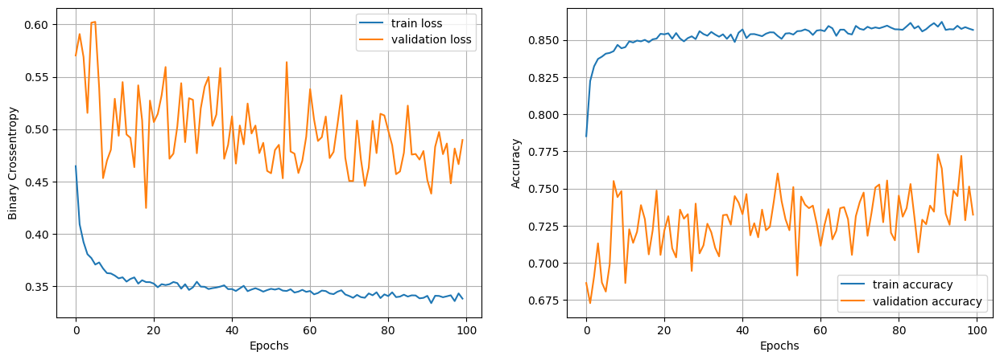

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8783 - loss: 0.3070
Epoch 1/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7015 - loss: 0.5470 - val_accuracy: 0.6071 - val_loss: 0.6866
Epoch 2/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8133 - loss: 0.4284 - val_accuracy: 0.6703 - val_loss: 0.6020
Epoch 3/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8290 - loss: 0.4009 - val_accuracy: 0.7240 - val_loss: 0.5279
Epoch 4/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8383 - loss: 0.3817 - val_accuracy: 0.7000 - val_loss: 0.5604
Epoch 5/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8420 - loss: 0.3869 - val_accuracy: 0.6902 - val_loss: 0.5964
Epoch 6/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8461 - loss: 0.3616 - val_accuracy: 0.6895 - val_loss: 0.5891
Epoch 7/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8392 - loss: 0.3703 - val_accuracy: 0.6882 - val_loss: 0.6008
Epoch 8/100
185/185 ━━

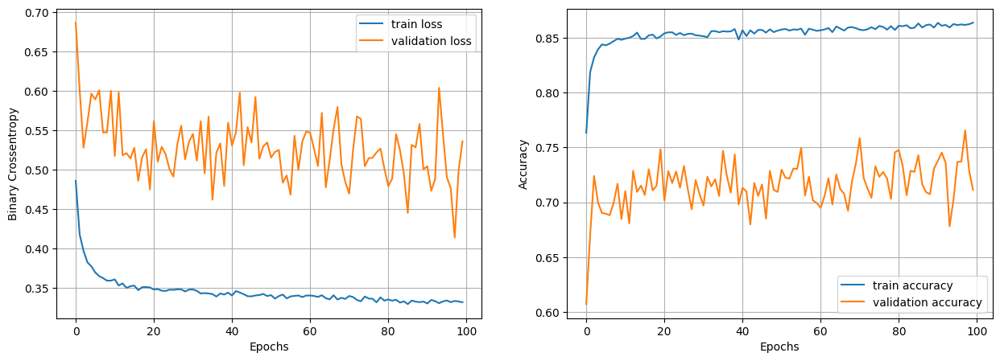

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8848 - loss: 0.3039
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6927 - loss: 0.5728 - val_accuracy: 0.6084 - val_loss: 0.6730
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7951 - loss: 0.4406 - val_accuracy: 0.6696 - val_loss: 0.6332
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8087 - loss: 0.4329 - val_accuracy: 0.6743 - val_loss: 0.6102
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8202 - loss: 0.4073 - val_accuracy: 0.7139 - val_loss: 0.5430
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8329 - loss: 0.3918 - val_accuracy: 0.6841 - val_loss: 0.5830
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8355 - loss: 0.3840 - val_accuracy: 0.7105 - val_loss: 0.5344
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8421 - loss: 0.3672 - val_accuracy: 0.6912 - val_loss: 0.5871
Epoch 8/100
93/93 ━━━━━━━━━━━━━━━━━━

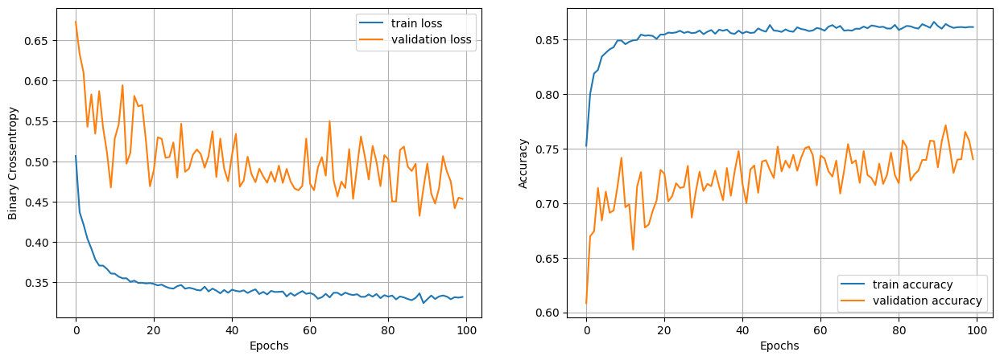

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8843 - loss: 0.3100  
Epoch 1/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.6802 - loss: 0.5899 - val_accuracy: 0.5865 - val_loss: 0.6744
Epoch 2/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7835 - loss: 0.4629 - val_accuracy: 0.6027 - val_loss: 0.6911
Epoch 3/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8060 - loss: 0.4330 - val_accuracy: 0.6446 - val_loss: 0.6391
Epoch 4/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8233 - loss: 0.4140 - val_accuracy: 0.6966 - val_loss: 0.5766
Epoch 5/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8284 - loss: 0.4075 - val_accuracy: 0.6916 - val_loss: 0.5907
Epoch 6/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8304 - loss: 0.4085 - val_accuracy: 0.7277 - val_loss: 0.5294
Epoch 7/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8357 - loss: 0.3932 - val_accuracy: 0.6919 - val_loss: 0.5782
Epoch 8/100
740/740 

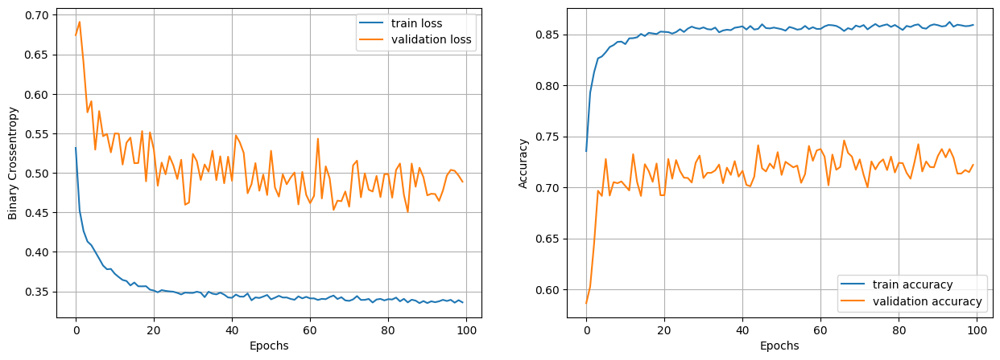

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8760 - loss: 0.3081  
Epoch 1/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6297 - loss: 0.6444 - val_accuracy: 0.5986 - val_loss: 0.6765
Epoch 2/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7804 - loss: 0.4757 - val_accuracy: 0.6345 - val_loss: 0.6282
Epoch 3/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8040 - loss: 0.4425 - val_accuracy: 0.6267 - val_loss: 0.6464
Epoch 4/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8008 - loss: 0.4345 - val_accuracy: 0.6432 - val_loss: 0.6334
Epoch 5/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8159 - loss: 0.4164 - val_accuracy: 0.6554 - val_loss: 0.6263
Epoch 6/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8103 - loss: 0.4303 - val_accuracy: 0.6828 - val_loss: 0.5717
Epoch 7/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8254 - loss: 0.4064 - val_accuracy: 0.6885 - val_loss: 0.5701
Epoch 8/100
370/370 

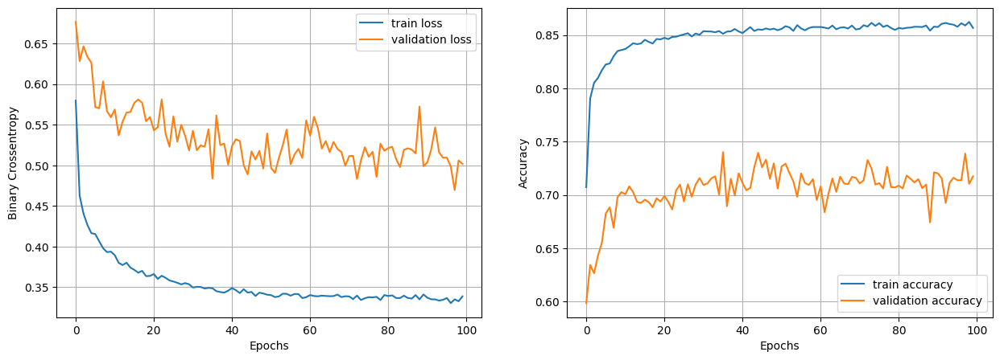

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8813 - loss: 0.3065  
Epoch 1/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6719 - loss: 0.6576 - val_accuracy: 0.6064 - val_loss: 0.6836
Epoch 2/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7873 - loss: 0.4679 - val_accuracy: 0.6287 - val_loss: 0.6576
Epoch 3/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7961 - loss: 0.4455 - val_accuracy: 0.6571 - val_loss: 0.6128
Epoch 4/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8024 - loss: 0.4384 - val_accuracy: 0.6615 - val_loss: 0.6313
Epoch 5/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8046 - loss: 0.4336 - val_accuracy: 0.6476 - val_loss: 0.6269
Epoch 6/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8171 - loss: 0.4159 - val_accuracy: 0.6642 - val_loss: 0.5953
Epoch 7/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8169 - loss: 0.4166 - val_accuracy: 0.6652 - val_loss: 0.5963
Epoch 8/100
185/185 

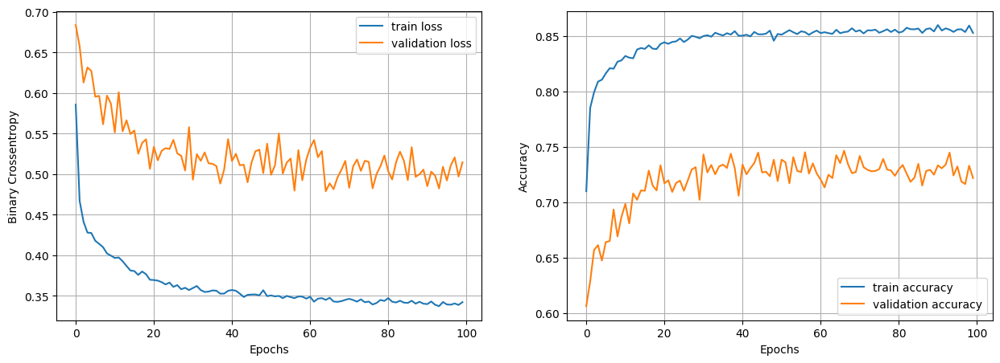

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8770 - loss: 0.3149
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5829 - loss: 0.7103 - val_accuracy: 0.1666 - val_loss: 0.8842
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6759 - loss: 0.6036 - val_accuracy: 0.5591 - val_loss: 0.7850
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7559 - loss: 0.5227 - val_accuracy: 0.6358 - val_loss: 0.6834
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7795 - loss: 0.4815 - val_accuracy: 0.6321 - val_loss: 0.6559
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7971 - loss: 0.4494 - val_accuracy: 0.6358 - val_loss: 0.6384
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8056 - loss: 0.4395 - val_accuracy: 0.6365 - val_loss: 0.6330
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8150 - loss: 0.4310 - val_accuracy: 0.6422 - val_loss: 0.6221
Epoch 8/100
93/93 ━━━━━━━━━━━━━━━━━━

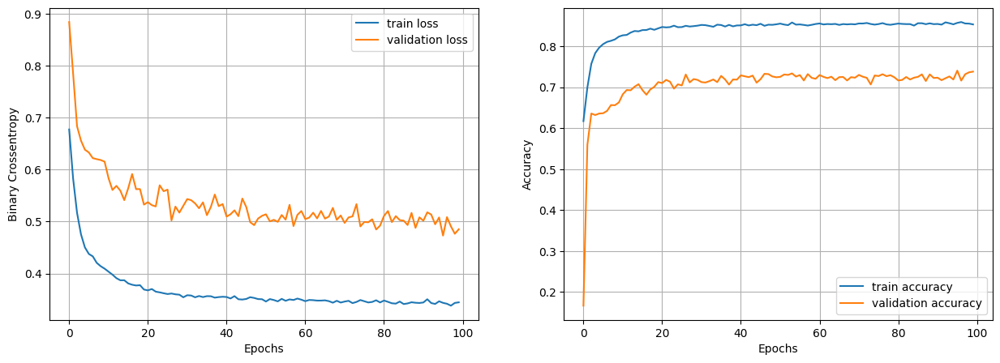

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8756 - loss: 0.3177
Epoch 1/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7390 - loss: 0.5565 - val_accuracy: 0.3247 - val_loss: 0.7204
Epoch 2/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7498 - loss: 0.5055 - val_accuracy: 0.1557 - val_loss: 0.7345
Epoch 3/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7116 - loss: 0.5274 - val_accuracy: 0.4659 - val_loss: 0.7070
Epoch 4/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7755 - loss: 0.4602 - val_accuracy: 0.4632 - val_loss: 0.7408
Epoch 5/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7846 - loss: 0.4501 - val_accuracy: 0.3682 - val_loss: 0.6997
Epoch 6/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7645 - loss: 0.4727 - val_accuracy: 0.5432 - val_loss: 0.5829
Epoch 7/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8063 - loss: 0.4380 - val_accuracy: 0.5892 - val_loss: 0.6704
Epoch 8/100
740/740 ━━

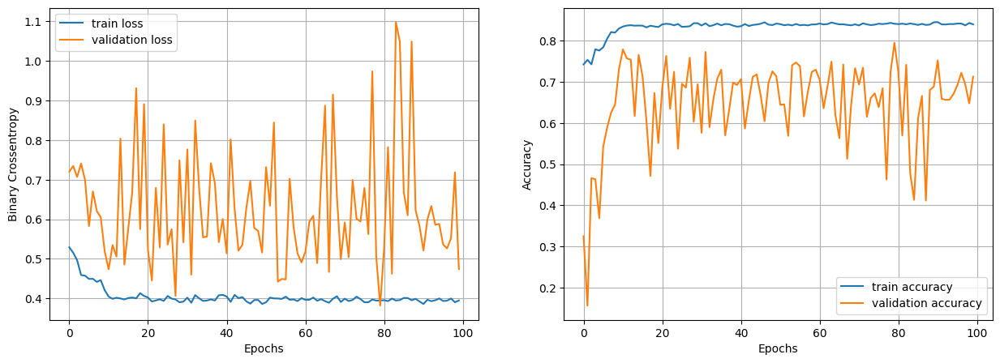

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8657 - loss: 0.3947
Epoch 1/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7753 - loss: 0.4890 - val_accuracy: 0.5801 - val_loss: 0.5312
Epoch 2/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8241 - loss: 0.4090 - val_accuracy: 0.6287 - val_loss: 0.6742
Epoch 3/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8369 - loss: 0.3819 - val_accuracy: 0.6405 - val_loss: 0.6147
Epoch 4/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8326 - loss: 0.3914 - val_accuracy: 0.6791 - val_loss: 0.6260
Epoch 5/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8341 - loss: 0.3832 - val_accuracy: 0.6287 - val_loss: 0.5281
Epoch 6/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8396 - loss: 0.3813 - val_accuracy: 0.7321 - val_loss: 0.6166
Epoch 7/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8344 - loss: 0.3998 - val_accuracy: 0.6794 - val_loss: 0.5870
Epoch 8/100
370/370 ━━

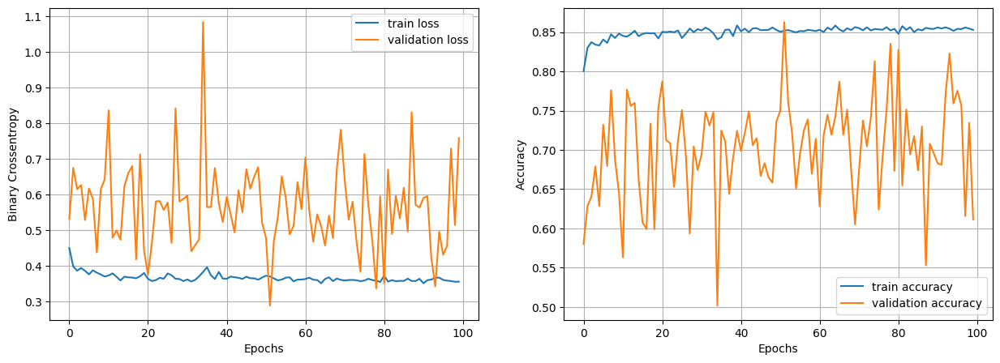

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8599 - loss: 0.3599  
Epoch 1/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7783 - loss: 0.4869 - val_accuracy: 0.5456 - val_loss: 0.7436
Epoch 2/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8386 - loss: 0.3926 - val_accuracy: 0.7436 - val_loss: 0.3720
Epoch 3/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8406 - loss: 0.3662 - val_accuracy: 0.6470 - val_loss: 0.5509
Epoch 4/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8441 - loss: 0.3657 - val_accuracy: 0.6074 - val_loss: 0.6540
Epoch 5/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8395 - loss: 0.3652 - val_accuracy: 0.7179 - val_loss: 0.4901
Epoch 6/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8508 - loss: 0.3649 - val_accuracy: 0.7179 - val_loss: 0.5374
Epoch 7/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8526 - loss: 0.3430 - val_accuracy: 0.6500 - val_loss: 0.6003
Epoch 8/100
185/185 

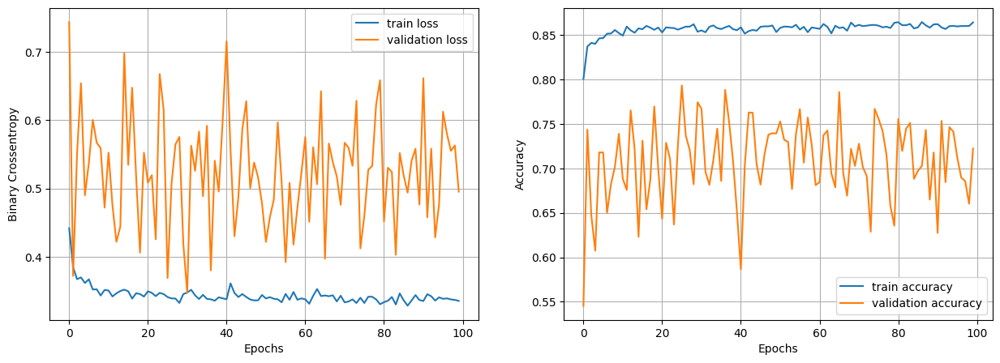

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8669 - loss: 0.3539  
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7822 - loss: 0.4761 - val_accuracy: 0.6355 - val_loss: 0.6371
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8395 - loss: 0.3753 - val_accuracy: 0.7311 - val_loss: 0.5426
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8530 - loss: 0.3530 - val_accuracy: 0.7858 - val_loss: 0.4706
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8527 - loss: 0.3545 - val_accuracy: 0.6872 - val_loss: 0.6310
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8485 - loss: 0.3656 - val_accuracy: 0.6861 - val_loss: 0.6330
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8558 - loss: 0.3538 - val_accuracy: 0.8027 - val_loss: 0.4060
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8534 - loss: 0.3392 - val_accuracy: 0.7382 - val_loss: 0.4574
Epoch 8/100
93/93 ━━━━━━━━━━━━━━━━

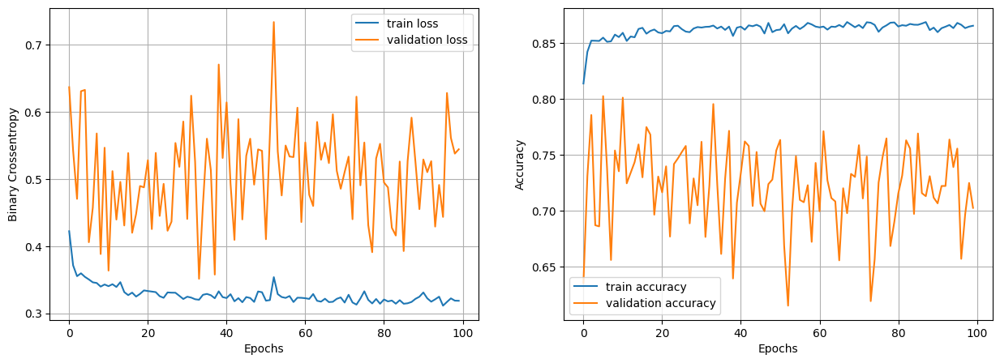

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8709 - loss: 0.3149
Epoch 1/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.7972 - loss: 0.4356 - val_accuracy: 0.7358 - val_loss: 0.4792
Epoch 2/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8609 - loss: 0.3433 - val_accuracy: 0.7054 - val_loss: 0.5706
Epoch 3/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8582 - loss: 0.3292 - val_accuracy: 0.7645 - val_loss: 0.3958
Epoch 4/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8591 - loss: 0.3356 - val_accuracy: 0.7669 - val_loss: 0.4386
Epoch 5/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8641 - loss: 0.3225 - val_accuracy: 0.7111 - val_loss: 0.5206
Epoch 6/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8685 - loss: 0.3165 - val_accuracy: 0.7304 - val_loss: 0.5696
Epoch 7/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8728 - loss: 0.3077 - val_accuracy: 0.7885 - val_loss: 0.4289
Epoch 8/100
740/740 ━━

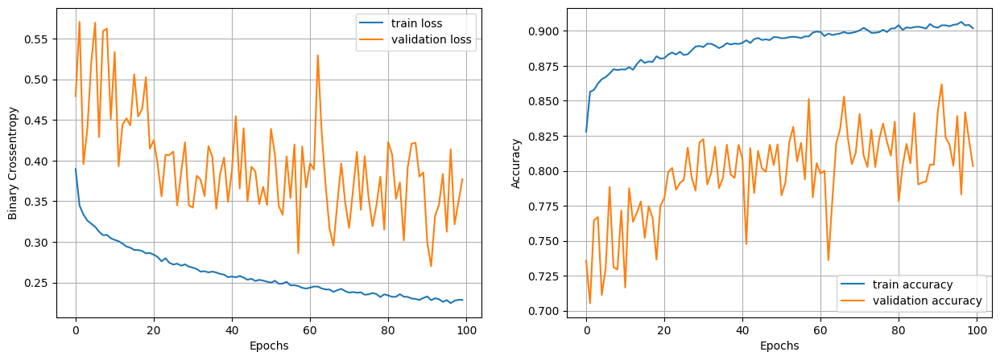

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8747 - loss: 0.3635  
Epoch 1/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7980 - loss: 0.4426 - val_accuracy: 0.6584 - val_loss: 0.6182
Epoch 2/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8555 - loss: 0.3512 - val_accuracy: 0.6899 - val_loss: 0.6041
Epoch 3/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8563 - loss: 0.3348 - val_accuracy: 0.7473 - val_loss: 0.4927
Epoch 4/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8631 - loss: 0.3267 - val_accuracy: 0.6902 - val_loss: 0.5817
Epoch 5/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8646 - loss: 0.3213 - val_accuracy: 0.7314 - val_loss: 0.4895
Epoch 6/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8606 - loss: 0.3217 - val_accuracy: 0.7176 - val_loss: 0.5294
Epoch 7/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8665 - loss: 0.3116 - val_accuracy: 0.7193 - val_loss: 0.5115
Epoch 8/100
370/370 

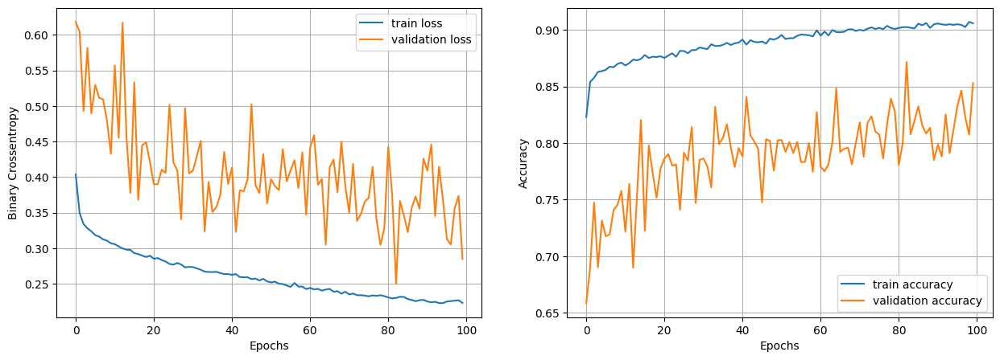

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8626 - loss: 0.3857
Epoch 1/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7843 - loss: 0.4711 - val_accuracy: 0.6956 - val_loss: 0.5590
Epoch 2/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8486 - loss: 0.3574 - val_accuracy: 0.7230 - val_loss: 0.5330
Epoch 3/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8519 - loss: 0.3433 - val_accuracy: 0.7321 - val_loss: 0.4940
Epoch 4/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8603 - loss: 0.3366 - val_accuracy: 0.7189 - val_loss: 0.4908
Epoch 5/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8705 - loss: 0.3162 - val_accuracy: 0.7250 - val_loss: 0.5115
Epoch 6/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8606 - loss: 0.3252 - val_accuracy: 0.7378 - val_loss: 0.4812
Epoch 7/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8627 - loss: 0.3254 - val_accuracy: 0.7213 - val_loss: 0.5404
Epoch 8/100
185/185 ━━

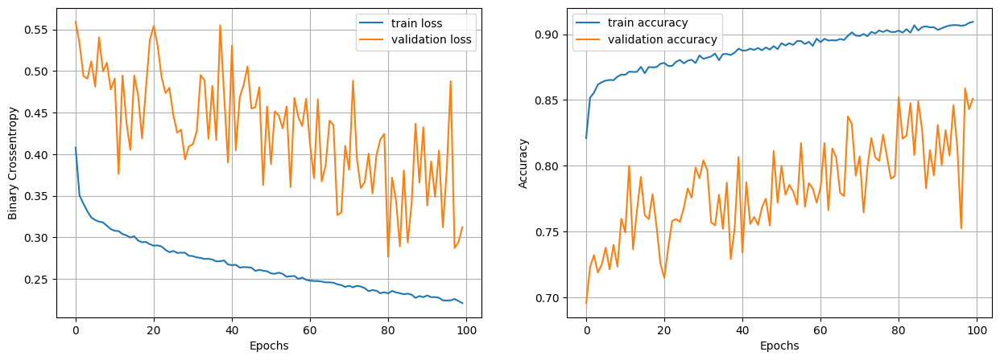

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8707 - loss: 0.3514  
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7672 - loss: 0.4947 - val_accuracy: 0.7291 - val_loss: 0.5282
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8356 - loss: 0.3774 - val_accuracy: 0.7125 - val_loss: 0.5735
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8447 - loss: 0.3567 - val_accuracy: 0.6936 - val_loss: 0.5825
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8553 - loss: 0.3391 - val_accuracy: 0.7466 - val_loss: 0.4836
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8551 - loss: 0.3401 - val_accuracy: 0.7463 - val_loss: 0.4603
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8579 - loss: 0.3294 - val_accuracy: 0.7095 - val_loss: 0.5430
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8600 - loss: 0.3238 - val_accuracy: 0.7426 - val_loss: 0.4787
Epoch 8/100
93/93 ━━━━━━━━━━━━━━━━

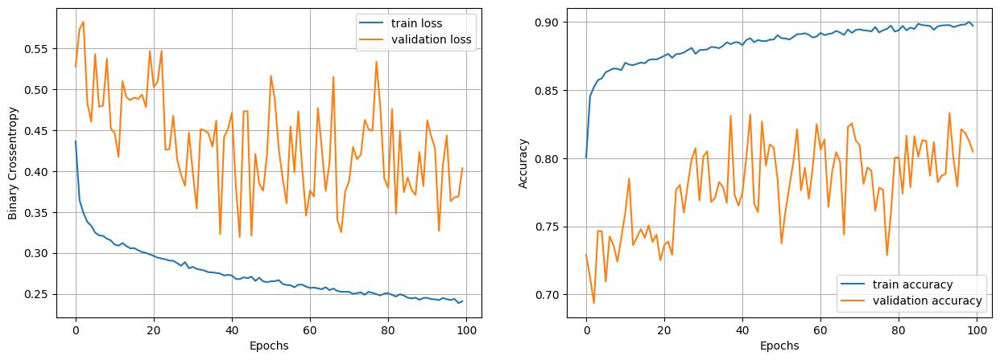

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8709 - loss: 0.3311
Epoch 1/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.7511 - loss: 0.5008 - val_accuracy: 0.6875 - val_loss: 0.5931
Epoch 2/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8479 - loss: 0.3666 - val_accuracy: 0.7284 - val_loss: 0.5205
Epoch 3/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8566 - loss: 0.3442 - val_accuracy: 0.7429 - val_loss: 0.5066
Epoch 4/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8583 - loss: 0.3285 - val_accuracy: 0.7179 - val_loss: 0.5271
Epoch 5/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8588 - loss: 0.3325 - val_accuracy: 0.7395 - val_loss: 0.4953
Epoch 6/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8636 - loss: 0.3253 - val_accuracy: 0.7287 - val_loss: 0.5174
Epoch 7/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8644 - loss: 0.3175 - val_accuracy: 0.7270 - val_loss: 0.5101
Epoch 8/100
740/740 ━━

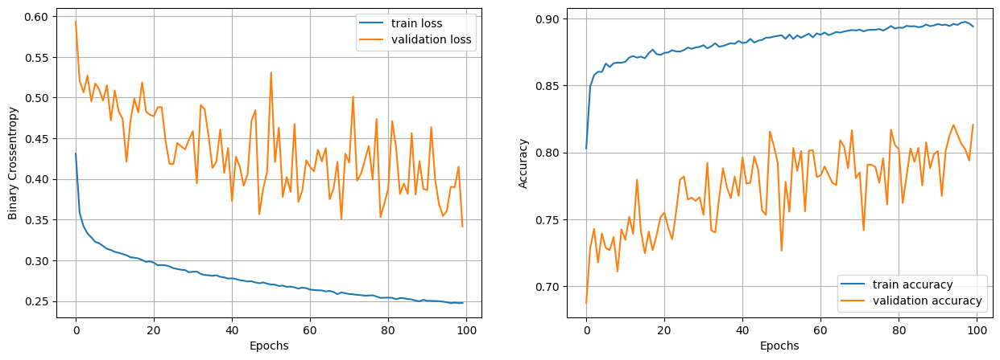

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8689 - loss: 0.3234  
Epoch 1/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7205 - loss: 0.5362 - val_accuracy: 0.6385 - val_loss: 0.6370
Epoch 2/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8311 - loss: 0.3905 - val_accuracy: 0.7122 - val_loss: 0.5405
Epoch 3/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8442 - loss: 0.3623 - val_accuracy: 0.7412 - val_loss: 0.4967
Epoch 4/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8529 - loss: 0.3462 - val_accuracy: 0.7132 - val_loss: 0.5370
Epoch 5/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8577 - loss: 0.3394 - val_accuracy: 0.7321 - val_loss: 0.5172
Epoch 6/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8578 - loss: 0.3316 - val_accuracy: 0.7057 - val_loss: 0.5462
Epoch 7/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8589 - loss: 0.3308 - val_accuracy: 0.7304 - val_loss: 0.4910
Epoch 8/100
370/370 

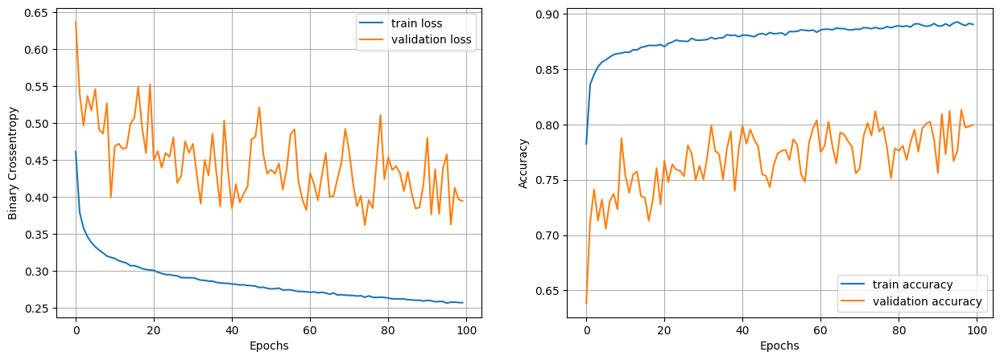

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8747 - loss: 0.3126
Epoch 1/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7056 - loss: 0.5721 - val_accuracy: 0.6486 - val_loss: 0.6345
Epoch 2/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8245 - loss: 0.3961 - val_accuracy: 0.6453 - val_loss: 0.6553
Epoch 3/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8388 - loss: 0.3741 - val_accuracy: 0.6949 - val_loss: 0.6030
Epoch 4/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8514 - loss: 0.3599 - val_accuracy: 0.7419 - val_loss: 0.4964
Epoch 5/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8498 - loss: 0.3498 - val_accuracy: 0.6973 - val_loss: 0.5812
Epoch 6/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8551 - loss: 0.3509 - val_accuracy: 0.6953 - val_loss: 0.5604
Epoch 7/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8615 - loss: 0.3330 - val_accuracy: 0.7166 - val_loss: 0.5315
Epoch 8/100
185/185 ━━

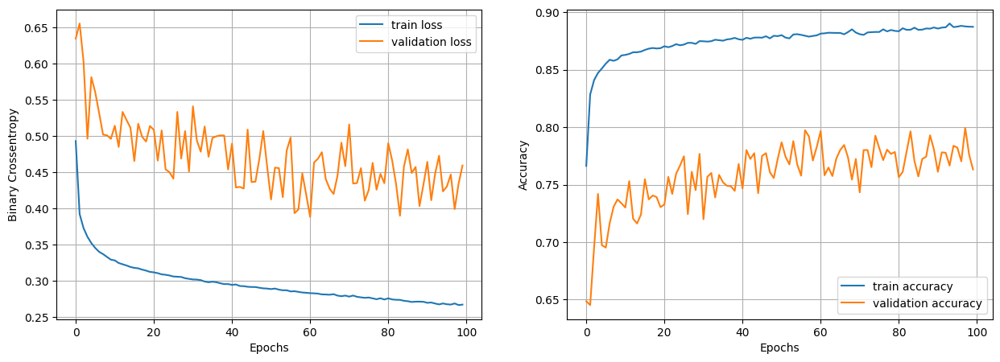

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8820 - loss: 0.3003  
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6578 - loss: 0.6054 - val_accuracy: 0.5791 - val_loss: 0.6821
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8029 - loss: 0.4268 - val_accuracy: 0.6193 - val_loss: 0.6527
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8156 - loss: 0.4059 - val_accuracy: 0.6436 - val_loss: 0.6311
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8269 - loss: 0.3899 - val_accuracy: 0.6524 - val_loss: 0.6273
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8360 - loss: 0.3835 - val_accuracy: 0.6919 - val_loss: 0.5891
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8507 - loss: 0.3577 - val_accuracy: 0.7253 - val_loss: 0.5243
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8517 - loss: 0.3586 - val_accuracy: 0.6747 - val_loss: 0.6110
Epoch 8/100
93/93 ━━━━━━━━━━━━━━━━

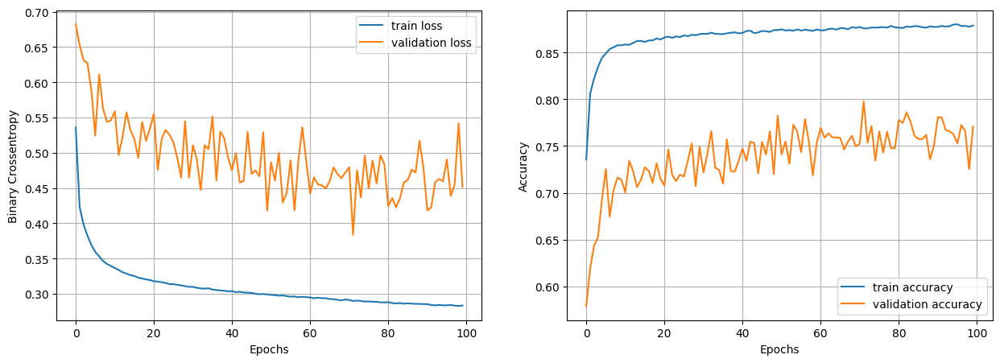

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8830 - loss: 0.3024
Epoch 1/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7009 - loss: 0.6249 - val_accuracy: 6.7568e-04 - val_loss: 2.9877
Epoch 2/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6327 - loss: 0.7087 - val_accuracy: 0.0000e+00 - val_loss: 0.9470
Epoch 3/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6297 - loss: 0.6617 - val_accuracy: 0.0000e+00 - val_loss: 0.9627
Epoch 4/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6217 - loss: 0.6702 - val_accuracy: 0.0000e+00 - val_loss: 0.8622
Epoch 5/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6315 - loss: 0.6601 - val_accuracy: 0.0000e+00 - val_loss: 1.0323
Epoch 6/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6258 - loss: 0.6642 - val_accuracy: 0.0000e+00 - val_loss: 0.9023
Epoch 7/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6194 - loss: 0.6662 - val_accuracy: 0.0000e+00 - val_loss: 1

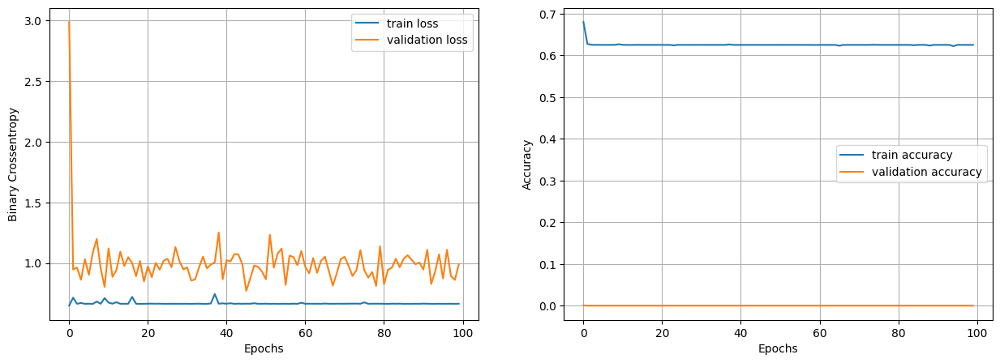

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6635 - loss: 0.6414
Epoch 1/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7372 - loss: 0.5748 - val_accuracy: 0.1868 - val_loss: 0.7437
Epoch 2/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7057 - loss: 0.5734 - val_accuracy: 0.1223 - val_loss: 0.8976
Epoch 3/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6706 - loss: 0.6901 - val_accuracy: 0.0304 - val_loss: 0.8739
Epoch 4/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6473 - loss: 0.6548 - val_accuracy: 0.2135 - val_loss: 0.7848
Epoch 5/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6801 - loss: 0.6316 - val_accuracy: 0.1243 - val_loss: 0.9414
Epoch 6/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6647 - loss: 0.6306 - val_accuracy: 0.1740 - val_loss: 0.8503
Epoch 7/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6629 - loss: 0.6456 - val_accuracy: 0.0000e+00 - val_loss: 0.8857
Epoch 8/100
370/37

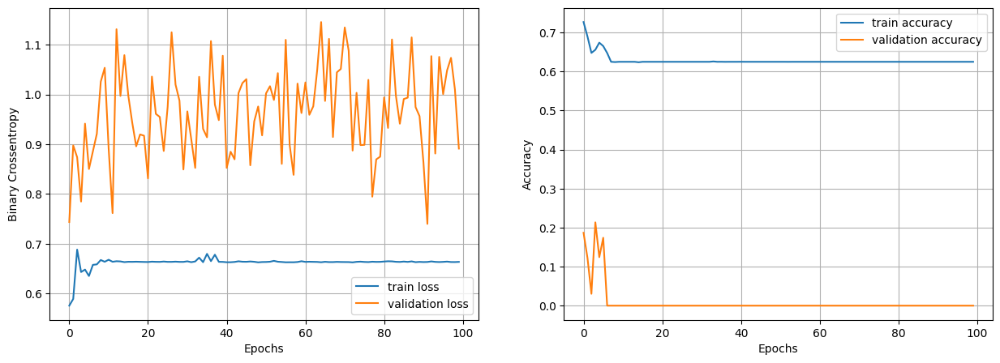

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6635 - loss: 0.6501  
Epoch 1/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7417 - loss: 0.5344 - val_accuracy: 0.5541 - val_loss: 0.5165
Epoch 2/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7804 - loss: 0.4785 - val_accuracy: 0.3929 - val_loss: 0.6188
Epoch 3/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7283 - loss: 0.5397 - val_accuracy: 0.1591 - val_loss: 0.9162
Epoch 4/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7254 - loss: 0.5318 - val_accuracy: 0.4611 - val_loss: 0.6478
Epoch 5/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7739 - loss: 0.4817 - val_accuracy: 0.4747 - val_loss: 0.6016
Epoch 6/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7893 - loss: 0.4652 - val_accuracy: 0.6899 - val_loss: 0.4879
Epoch 7/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8074 - loss: 0.4393 - val_accuracy: 0.5622 - val_loss: 0.6412
Epoch 8/100
185/185 

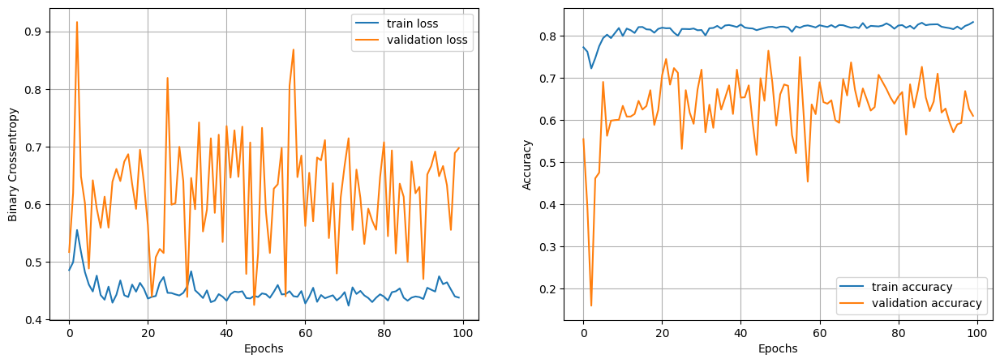

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8501 - loss: 0.3894  
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7552 - loss: 0.5247 - val_accuracy: 0.7270 - val_loss: 0.4074
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8132 - loss: 0.4271 - val_accuracy: 0.6030 - val_loss: 0.6905
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8111 - loss: 0.4267 - val_accuracy: 0.7608 - val_loss: 0.5074
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8130 - loss: 0.4293 - val_accuracy: 0.6115 - val_loss: 0.6683
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8177 - loss: 0.4265 - val_accuracy: 0.6760 - val_loss: 0.3626
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8233 - loss: 0.4208 - val_accuracy: 0.6270 - val_loss: 0.5795
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8242 - loss: 0.4180 - val_accuracy: 0.7213 - val_loss: 0.3945
Epoch 8/100
93/93 ━━━━━━━━━━━━━━━━

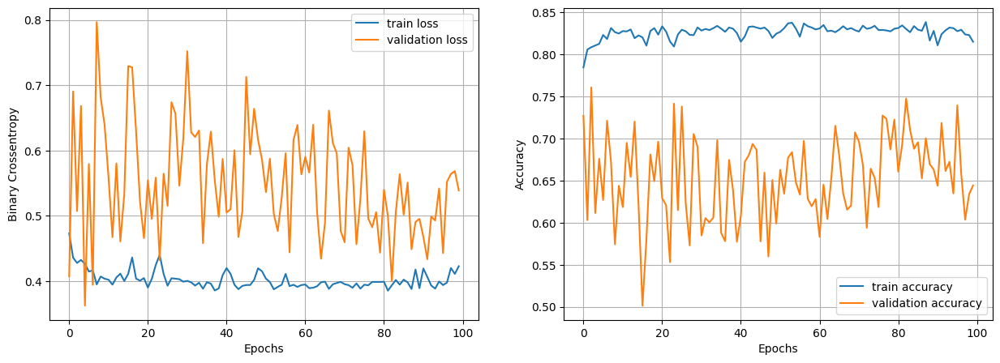

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8585 - loss: 0.3547
Epoch 1/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7639 - loss: 0.4811 - val_accuracy: 0.7635 - val_loss: 0.4953
Epoch 2/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8345 - loss: 0.3803 - val_accuracy: 0.7240 - val_loss: 0.5831
Epoch 3/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8512 - loss: 0.3581 - val_accuracy: 0.6588 - val_loss: 0.5989
Epoch 4/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8542 - loss: 0.3470 - val_accuracy: 0.7338 - val_loss: 0.4846
Epoch 5/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8483 - loss: 0.3570 - val_accuracy: 0.7111 - val_loss: 0.5352
Epoch 6/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8512 - loss: 0.3546 - val_accuracy: 0.7125 - val_loss: 0.5254
Epoch 7/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8541 - loss: 0.3534 - val_accuracy: 0.6902 - val_loss: 0.5383
Epoch 8/100
740/740 ━━

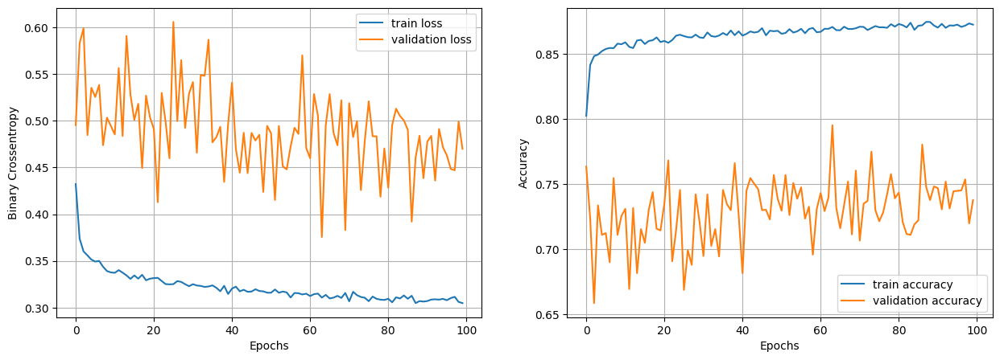

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8855 - loss: 0.3009  
Epoch 1/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7786 - loss: 0.4790 - val_accuracy: 0.6615 - val_loss: 0.5813
Epoch 2/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8210 - loss: 0.4070 - val_accuracy: 0.7500 - val_loss: 0.4840
Epoch 3/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8516 - loss: 0.3589 - val_accuracy: 0.7159 - val_loss: 0.5188
Epoch 4/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8549 - loss: 0.3486 - val_accuracy: 0.6838 - val_loss: 0.5887
Epoch 5/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8488 - loss: 0.3572 - val_accuracy: 0.7068 - val_loss: 0.5179
Epoch 6/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8493 - loss: 0.3540 - val_accuracy: 0.6858 - val_loss: 0.5597
Epoch 7/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8580 - loss: 0.3422 - val_accuracy: 0.7402 - val_loss: 0.5031
Epoch 8/100
370/370 

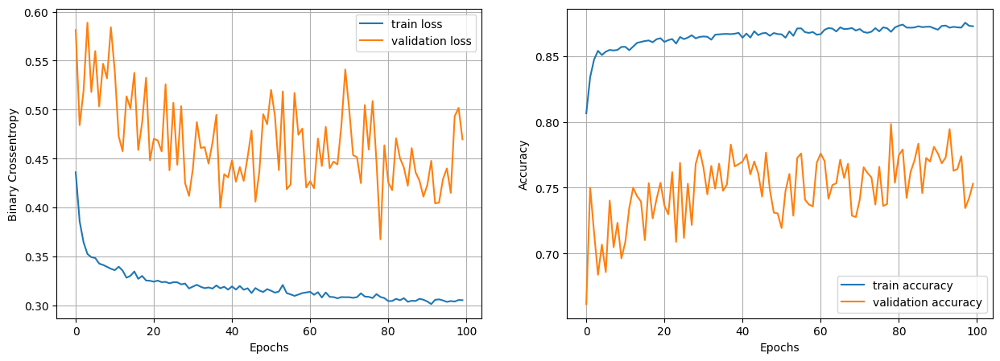

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8805 - loss: 0.3034  
Epoch 1/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.7557 - loss: 0.4861 - val_accuracy: 0.6639 - val_loss: 0.5774
Epoch 2/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8273 - loss: 0.3944 - val_accuracy: 0.7230 - val_loss: 0.5253
Epoch 3/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8393 - loss: 0.3803 - val_accuracy: 0.6541 - val_loss: 0.6378
Epoch 4/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8466 - loss: 0.3647 - val_accuracy: 0.7213 - val_loss: 0.5176
Epoch 5/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8496 - loss: 0.3564 - val_accuracy: 0.7270 - val_loss: 0.5175
Epoch 6/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8519 - loss: 0.3468 - val_accuracy: 0.7078 - val_loss: 0.5515
Epoch 7/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8545 - loss: 0.3465 - val_accuracy: 0.7436 - val_loss: 0.4979
Epoch 8/100
185/185 

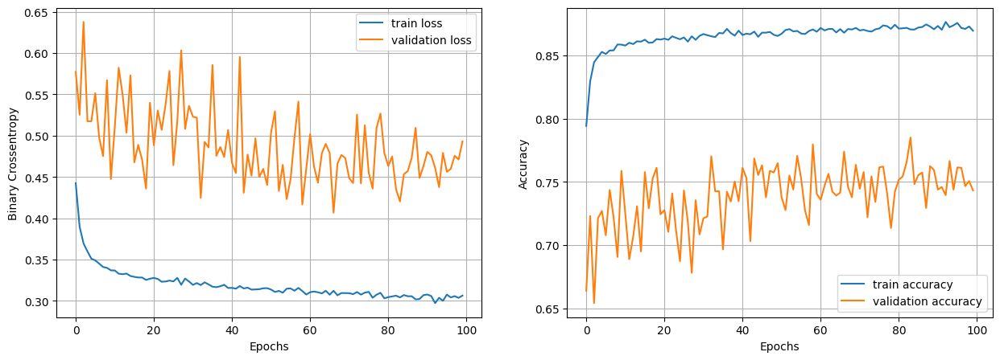

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8881 - loss: 0.3028
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6879 - loss: 0.5670 - val_accuracy: 0.6166 - val_loss: 0.6540
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8171 - loss: 0.4079 - val_accuracy: 0.6601 - val_loss: 0.6189
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8364 - loss: 0.3849 - val_accuracy: 0.6578 - val_loss: 0.6124
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8412 - loss: 0.3634 - val_accuracy: 0.7284 - val_loss: 0.5100
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8493 - loss: 0.3563 - val_accuracy: 0.6899 - val_loss: 0.5798
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8463 - loss: 0.3598 - val_accuracy: 0.7024 - val_loss: 0.5609
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8576 - loss: 0.3435 - val_accuracy: 0.7057 - val_loss: 0.5327
Epoch 8/100
93/93 ━━━━━━━━━━━━━━━━━━

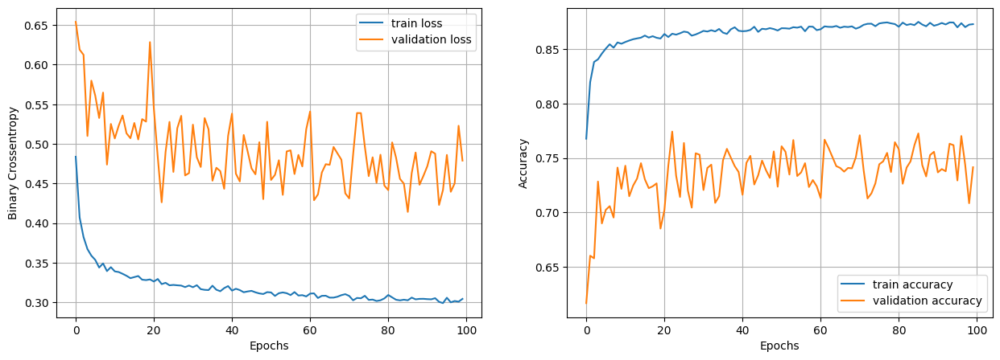

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8820 - loss: 0.2953
Epoch 1/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7160 - loss: 0.5452 - val_accuracy: 0.6291 - val_loss: 0.6519
Epoch 2/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8235 - loss: 0.4041 - val_accuracy: 0.7439 - val_loss: 0.5069
Epoch 3/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8309 - loss: 0.3841 - val_accuracy: 0.7010 - val_loss: 0.5785
Epoch 4/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8383 - loss: 0.3717 - val_accuracy: 0.7236 - val_loss: 0.5325
Epoch 5/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8390 - loss: 0.3760 - val_accuracy: 0.7007 - val_loss: 0.5781
Epoch 6/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8551 - loss: 0.3502 - val_accuracy: 0.7338 - val_loss: 0.5002
Epoch 7/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8534 - loss: 0.3510 - val_accuracy: 0.6997 - val_loss: 0.5536
Epoch 8/100
740/740 ━━

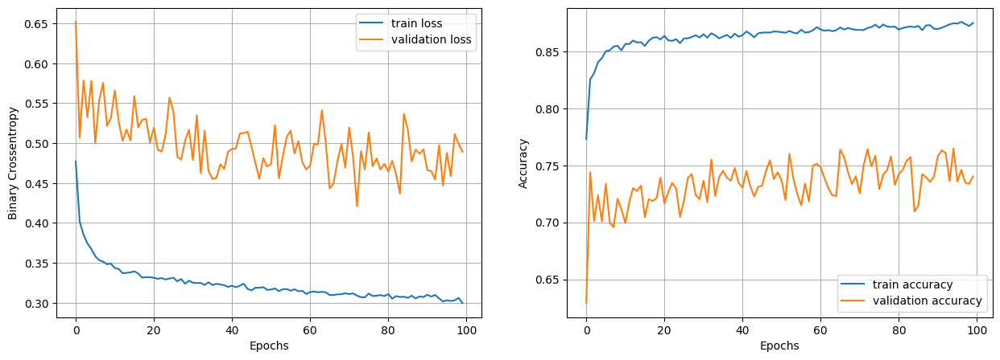

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8895 - loss: 0.2864
Epoch 1/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.6743 - loss: 0.5868 - val_accuracy: 0.6439 - val_loss: 0.6065
Epoch 2/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8155 - loss: 0.4244 - val_accuracy: 0.6625 - val_loss: 0.5870
Epoch 3/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8188 - loss: 0.4065 - val_accuracy: 0.6818 - val_loss: 0.5837
Epoch 4/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8245 - loss: 0.4014 - val_accuracy: 0.6669 - val_loss: 0.6206
Epoch 5/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8368 - loss: 0.3818 - val_accuracy: 0.7071 - val_loss: 0.5647
Epoch 6/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8441 - loss: 0.3737 - val_accuracy: 0.7139 - val_loss: 0.5450
Epoch 7/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8368 - loss: 0.3799 - val_accuracy: 0.7226 - val_loss: 0.5221
Epoch 8/100
370/370 ━━

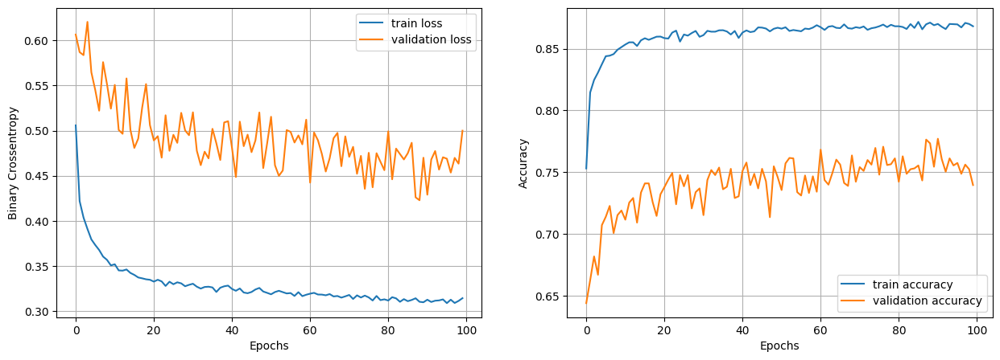

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8838 - loss: 0.2937  
Epoch 1/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6682 - loss: 0.6170 - val_accuracy: 0.5868 - val_loss: 0.6926
Epoch 2/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7891 - loss: 0.4582 - val_accuracy: 0.5838 - val_loss: 0.7123
Epoch 3/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8054 - loss: 0.4263 - val_accuracy: 0.6632 - val_loss: 0.6202
Epoch 4/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8204 - loss: 0.4122 - val_accuracy: 0.6578 - val_loss: 0.6125
Epoch 5/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8227 - loss: 0.4099 - val_accuracy: 0.6736 - val_loss: 0.5957
Epoch 6/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8311 - loss: 0.3911 - val_accuracy: 0.6872 - val_loss: 0.5792
Epoch 7/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8449 - loss: 0.3732 - val_accuracy: 0.6696 - val_loss: 0.6244
Epoch 8/100
185/185 

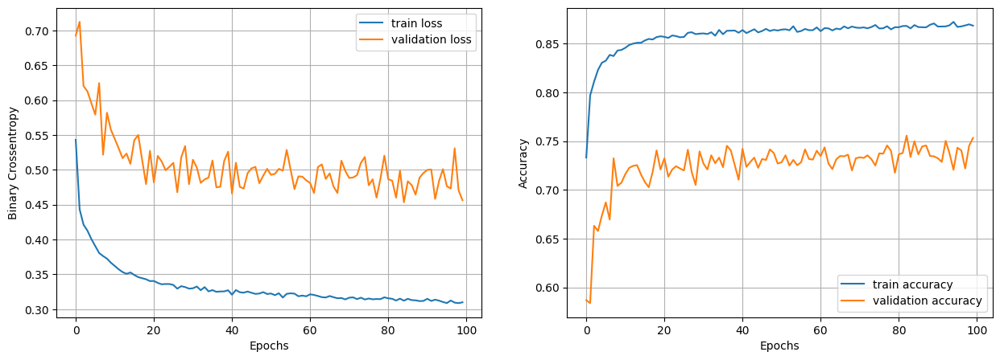

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8866 - loss: 0.2963
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6410 - loss: 0.6445 - val_accuracy: 0.5821 - val_loss: 0.7248
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7830 - loss: 0.4705 - val_accuracy: 0.6216 - val_loss: 0.6687
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8035 - loss: 0.4362 - val_accuracy: 0.6358 - val_loss: 0.6390
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8092 - loss: 0.4224 - val_accuracy: 0.6304 - val_loss: 0.6576
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8101 - loss: 0.4202 - val_accuracy: 0.6774 - val_loss: 0.6038
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8203 - loss: 0.4136 - val_accuracy: 0.6807 - val_loss: 0.5910
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8248 - loss: 0.4024 - val_accuracy: 0.6767 - val_loss: 0.6016
Epoch 8/100
93/93 ━━━━━━━━━━━━━━━━━━

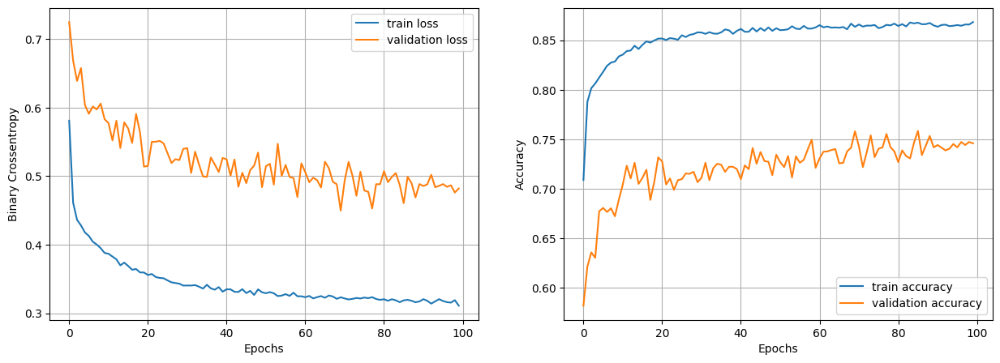

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8821 - loss: 0.2991
Epoch 1/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.7282 - loss: 0.5713 - val_accuracy: 0.2557 - val_loss: 0.7011
Epoch 2/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7179 - loss: 0.5550 - val_accuracy: 0.2584 - val_loss: 0.7647
Epoch 3/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6461 - loss: 0.5908 - val_accuracy: 0.9145 - val_loss: 0.9407
Epoch 4/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6388 - loss: 0.5915 - val_accuracy: 6.7568e-04 - val_loss: 0.8911
Epoch 5/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6441 - loss: 0.5604 - val_accuracy: 3.3784e-04 - val_loss: 0.8417
Epoch 6/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6302 - loss: 0.5663 - val_accuracy: 0.0034 - val_loss: 1.2241
Epoch 7/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6674 - loss: 0.5714 - val_accuracy: 0.9176 - val_loss: 0.8762
Epoch 8/100
74

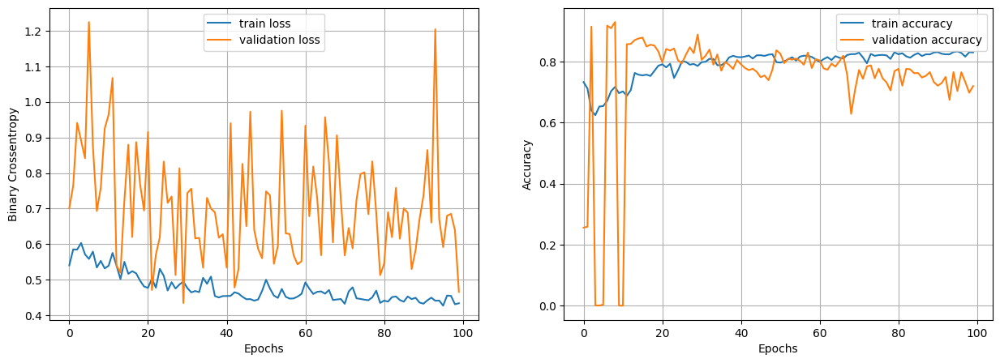

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8290 - loss: 0.4418  
Epoch 1/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7727 - loss: 0.5260 - val_accuracy: 0.0186 - val_loss: 2.7300
Epoch 2/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7140 - loss: 0.5236 - val_accuracy: 0.4578 - val_loss: 0.5807
Epoch 3/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6980 - loss: 0.5728 - val_accuracy: 0.9389 - val_loss: 0.6929
Epoch 4/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7072 - loss: 0.5450 - val_accuracy: 0.8652 - val_loss: 0.3593
Epoch 5/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8235 - loss: 0.4339 - val_accuracy: 0.7747 - val_loss: 0.4979
Epoch 6/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8395 - loss: 0.3969 - val_accuracy: 0.7997 - val_loss: 0.4549
Epoch 7/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8288 - loss: 0.4089 - val_accuracy: 0.6679 - val_loss: 0.9131
Epoch 8/100
370/370 

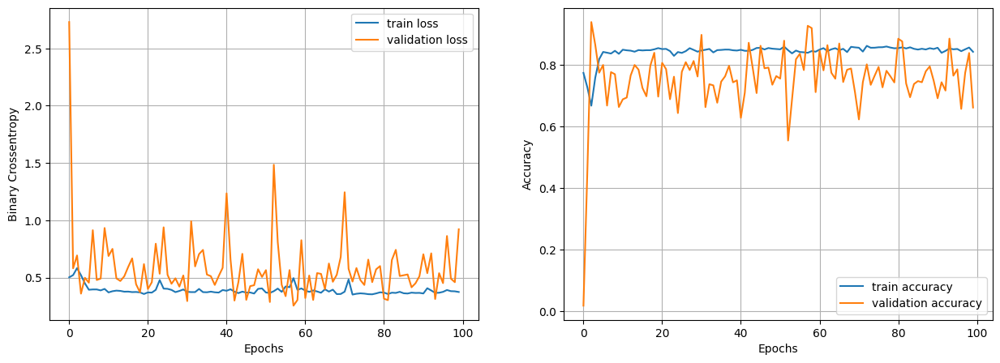

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8659 - loss: 0.3879  
Epoch 1/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7723 - loss: 0.5082 - val_accuracy: 0.6777 - val_loss: 0.6442
Epoch 2/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8366 - loss: 0.3973 - val_accuracy: 0.5385 - val_loss: 0.7433
Epoch 3/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8472 - loss: 0.3613 - val_accuracy: 0.5733 - val_loss: 0.6149
Epoch 4/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8443 - loss: 0.3695 - val_accuracy: 0.6878 - val_loss: 0.5154
Epoch 5/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8384 - loss: 0.3711 - val_accuracy: 0.7314 - val_loss: 0.4159
Epoch 6/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8347 - loss: 0.3802 - val_accuracy: 0.6311 - val_loss: 0.6863
Epoch 7/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8482 - loss: 0.3571 - val_accuracy: 0.7821 - val_loss: 0.4128
Epoch 8/100
185/185 

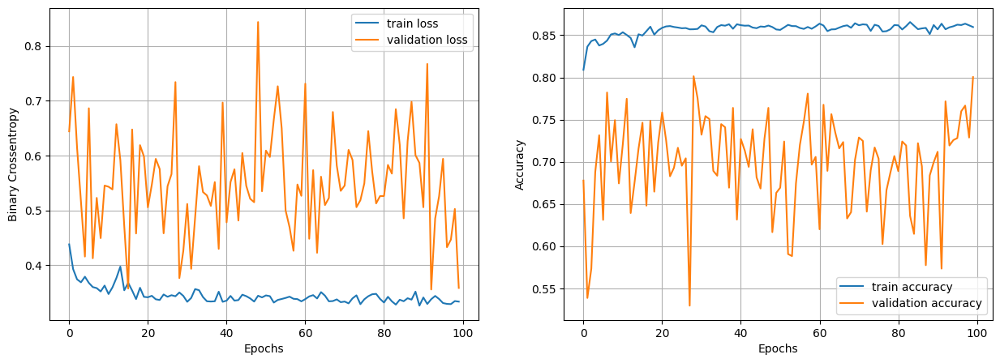

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8555 - loss: 0.4181  
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7172 - loss: 0.6534 - val_accuracy: 0.6780 - val_loss: 0.7335
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8304 - loss: 0.4021 - val_accuracy: 0.7304 - val_loss: 0.5425
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8442 - loss: 0.3626 - val_accuracy: 0.7159 - val_loss: 0.5406
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8475 - loss: 0.3533 - val_accuracy: 0.7007 - val_loss: 0.6424
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8532 - loss: 0.3503 - val_accuracy: 0.7446 - val_loss: 0.4232
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8501 - loss: 0.3549 - val_accuracy: 0.7821 - val_loss: 0.5520
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8548 - loss: 0.3501 - val_accuracy: 0.6122 - val_loss: 0.5887
Epoch 8/100
93/93 ━━━━━━━━━━━━━━━━

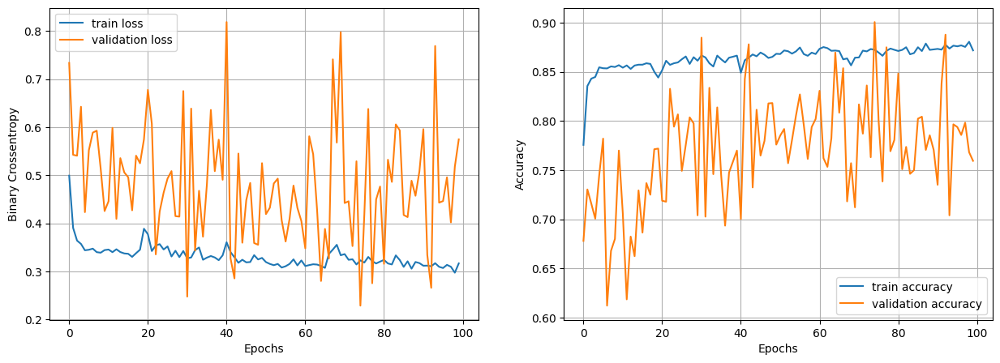

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8782 - loss: 0.3279
Epoch 1/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.8079 - loss: 0.4151 - val_accuracy: 0.6973 - val_loss: 0.5817
Epoch 2/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8501 - loss: 0.3569 - val_accuracy: 0.7125 - val_loss: 0.5505
Epoch 3/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8631 - loss: 0.3252 - val_accuracy: 0.7199 - val_loss: 0.5239
Epoch 4/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8653 - loss: 0.3247 - val_accuracy: 0.6990 - val_loss: 0.5551
Epoch 5/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8611 - loss: 0.3212 - val_accuracy: 0.7470 - val_loss: 0.4616
Epoch 6/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8693 - loss: 0.3093 - val_accuracy: 0.7307 - val_loss: 0.4870
Epoch 7/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8652 - loss: 0.3128 - val_accuracy: 0.7125 - val_loss: 0.5228
Epoch 8/100
740/740 ━━

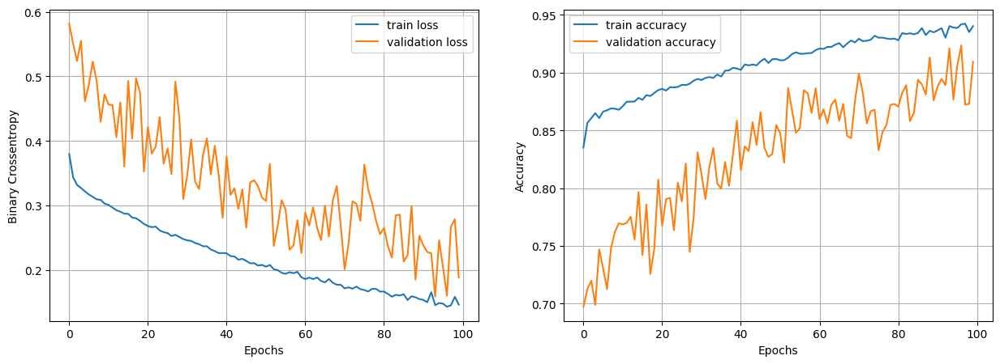

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8634 - loss: 0.6025  
Epoch 1/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7991 - loss: 0.4314 - val_accuracy: 0.7098 - val_loss: 0.5253
Epoch 2/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8477 - loss: 0.3544 - val_accuracy: 0.7578 - val_loss: 0.4266
Epoch 3/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8608 - loss: 0.3249 - val_accuracy: 0.7287 - val_loss: 0.5263
Epoch 4/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8616 - loss: 0.3230 - val_accuracy: 0.7247 - val_loss: 0.5100
Epoch 5/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8624 - loss: 0.3252 - val_accuracy: 0.7541 - val_loss: 0.4680
Epoch 6/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8710 - loss: 0.3076 - val_accuracy: 0.7000 - val_loss: 0.5643
Epoch 7/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8717 - loss: 0.3091 - val_accuracy: 0.7676 - val_loss: 0.4233
Epoch 8/100
370/370 

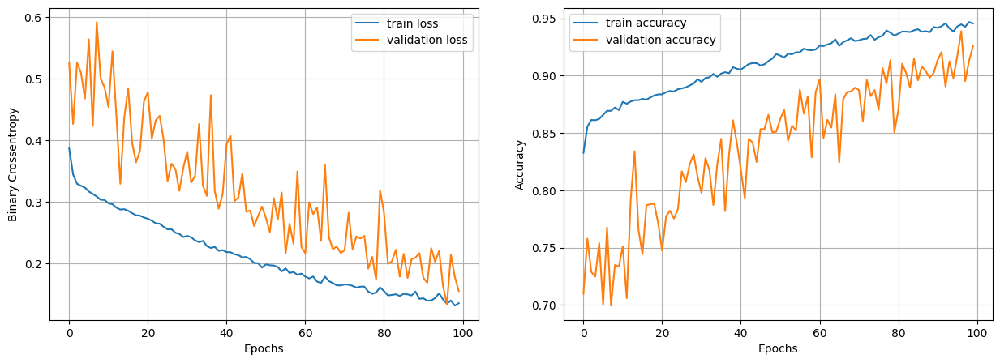

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8544 - loss: 0.6312  
Epoch 1/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7981 - loss: 0.4422 - val_accuracy: 0.7216 - val_loss: 0.5476
Epoch 2/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8552 - loss: 0.3458 - val_accuracy: 0.7639 - val_loss: 0.4720
Epoch 3/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8642 - loss: 0.3256 - val_accuracy: 0.7297 - val_loss: 0.5074
Epoch 4/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8664 - loss: 0.3232 - val_accuracy: 0.7328 - val_loss: 0.5192
Epoch 5/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8652 - loss: 0.3159 - val_accuracy: 0.7730 - val_loss: 0.4313
Epoch 6/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8690 - loss: 0.3079 - val_accuracy: 0.7834 - val_loss: 0.4208
Epoch 7/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8686 - loss: 0.3126 - val_accuracy: 0.7652 - val_loss: 0.4732
Epoch 8/100
185/185 

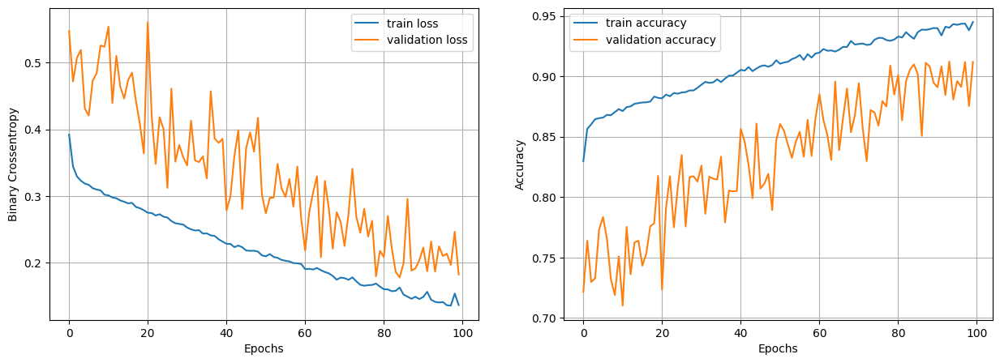

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8610 - loss: 0.5221
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7604 - loss: 0.4806 - val_accuracy: 0.7149 - val_loss: 0.5397
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8497 - loss: 0.3514 - val_accuracy: 0.6939 - val_loss: 0.5889
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8628 - loss: 0.3265 - val_accuracy: 0.6905 - val_loss: 0.5487
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8607 - loss: 0.3226 - val_accuracy: 0.7895 - val_loss: 0.4075
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8670 - loss: 0.3165 - val_accuracy: 0.7054 - val_loss: 0.5653
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8633 - loss: 0.3192 - val_accuracy: 0.7483 - val_loss: 0.4614
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8650 - loss: 0.3218 - val_accuracy: 0.7084 - val_loss: 0.5669
Epoch 8/100
93/93 ━━━━━━━━━━━━━━━━━━

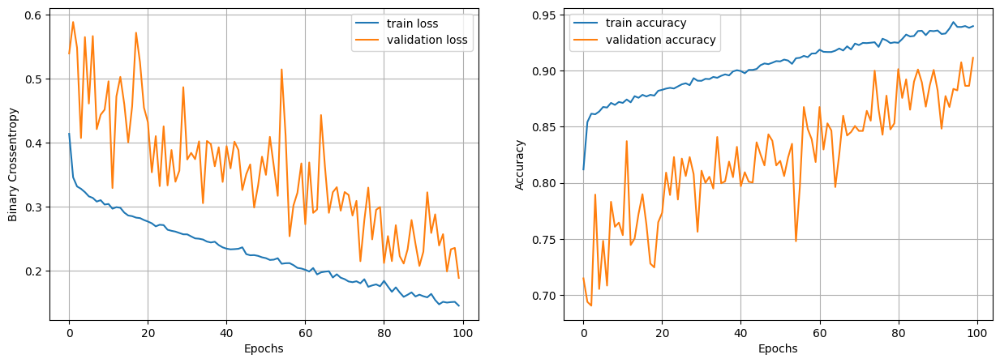

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8643 - loss: 0.4477
Epoch 1/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.7795 - loss: 0.4815 - val_accuracy: 0.7267 - val_loss: 0.5953
Epoch 2/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8531 - loss: 0.3574 - val_accuracy: 0.7057 - val_loss: 0.5637
Epoch 3/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8578 - loss: 0.3407 - val_accuracy: 0.7976 - val_loss: 0.4068
Epoch 4/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8655 - loss: 0.3240 - val_accuracy: 0.7334 - val_loss: 0.4990
Epoch 5/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8631 - loss: 0.3248 - val_accuracy: 0.7571 - val_loss: 0.4601
Epoch 6/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8613 - loss: 0.3264 - val_accuracy: 0.6939 - val_loss: 0.6548
Epoch 7/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8656 - loss: 0.3145 - val_accuracy: 0.7666 - val_loss: 0.4479
Epoch 8/100
740/740 ━━

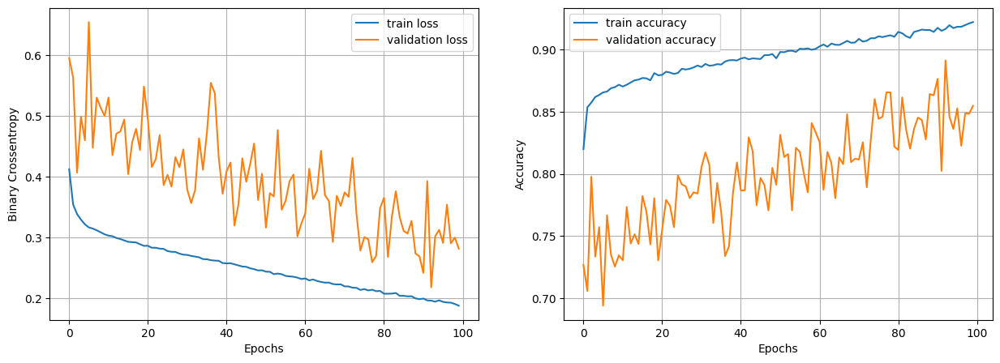

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8690 - loss: 0.3750
Epoch 1/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7501 - loss: 0.4943 - val_accuracy: 0.6841 - val_loss: 0.5939
Epoch 2/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8463 - loss: 0.3689 - val_accuracy: 0.7486 - val_loss: 0.4958
Epoch 3/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8507 - loss: 0.3538 - val_accuracy: 0.7030 - val_loss: 0.5699
Epoch 4/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8576 - loss: 0.3425 - val_accuracy: 0.7098 - val_loss: 0.5673
Epoch 5/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8622 - loss: 0.3304 - val_accuracy: 0.7078 - val_loss: 0.5471
Epoch 6/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8607 - loss: 0.3272 - val_accuracy: 0.6885 - val_loss: 0.5935
Epoch 7/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8623 - loss: 0.3213 - val_accuracy: 0.7071 - val_loss: 0.5243
Epoch 8/100
370/370 ━━

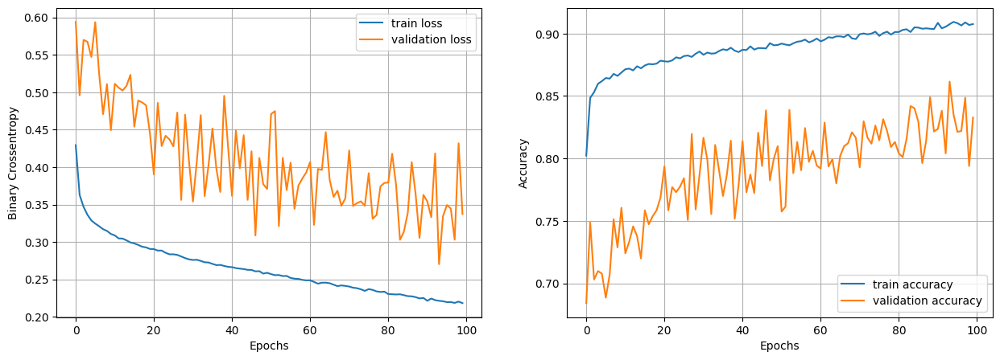

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8819 - loss: 0.3106
Epoch 1/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7585 - loss: 0.5135 - val_accuracy: 0.6625 - val_loss: 0.6361
Epoch 2/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8432 - loss: 0.3689 - val_accuracy: 0.7389 - val_loss: 0.5028
Epoch 3/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8456 - loss: 0.3608 - val_accuracy: 0.7213 - val_loss: 0.5462
Epoch 4/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8554 - loss: 0.3462 - val_accuracy: 0.7307 - val_loss: 0.5330
Epoch 5/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8602 - loss: 0.3408 - val_accuracy: 0.7159 - val_loss: 0.5477
Epoch 6/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8617 - loss: 0.3279 - val_accuracy: 0.7149 - val_loss: 0.5489
Epoch 7/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8702 - loss: 0.3128 - val_accuracy: 0.7584 - val_loss: 0.4683
Epoch 8/100
185/185 ━━

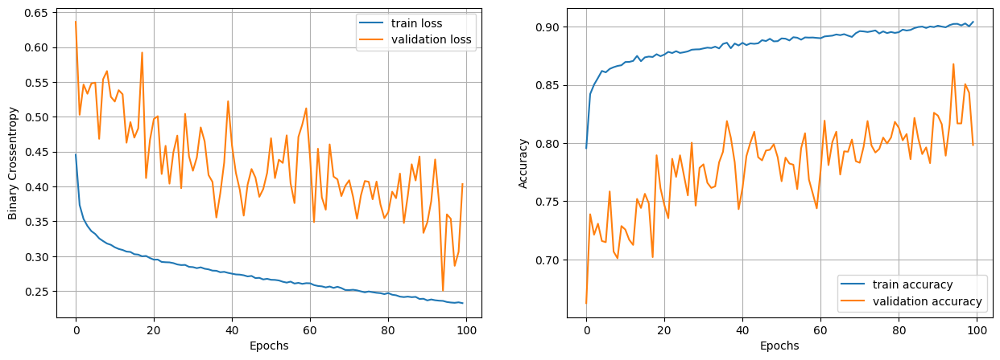

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8863 - loss: 0.3067
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7693 - loss: 0.5359 - val_accuracy: 0.6243 - val_loss: 0.6530
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8230 - loss: 0.3947 - val_accuracy: 0.6760 - val_loss: 0.5938
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8434 - loss: 0.3679 - val_accuracy: 0.7014 - val_loss: 0.5526
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8546 - loss: 0.3515 - val_accuracy: 0.6905 - val_loss: 0.5965
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8569 - loss: 0.3440 - val_accuracy: 0.7348 - val_loss: 0.5133
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8556 - loss: 0.3422 - val_accuracy: 0.7084 - val_loss: 0.5451
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8620 - loss: 0.3313 - val_accuracy: 0.7003 - val_loss: 0.5702
Epoch 8/100
93/93 ━━━━━━━━━━━━━━━━━━

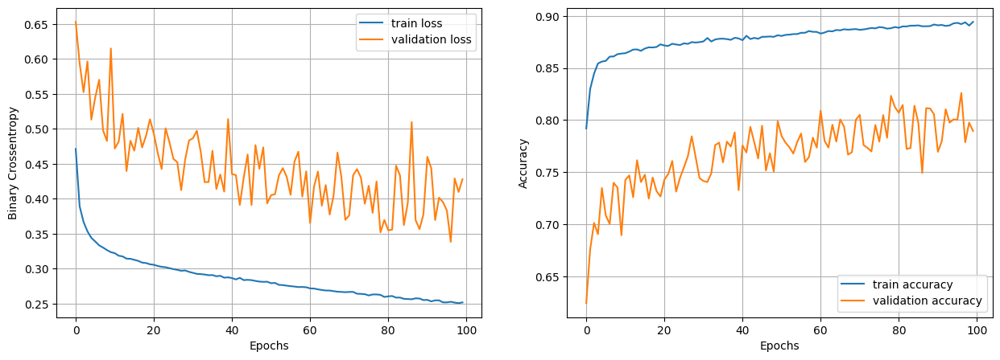

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8828 - loss: 0.3022
Epoch 1/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.6925 - loss: 0.6540 - val_accuracy: 0.1973 - val_loss: 0.9809
Epoch 2/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6415 - loss: 0.6792 - val_accuracy: 0.0000e+00 - val_loss: 0.9214
Epoch 3/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6364 - loss: 0.6600 - val_accuracy: 0.0000e+00 - val_loss: 0.9988
Epoch 4/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6260 - loss: 0.6686 - val_accuracy: 0.0000e+00 - val_loss: 0.9458
Epoch 5/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6242 - loss: 0.6645 - val_accuracy: 0.0000e+00 - val_loss: 0.8153
Epoch 6/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6224 - loss: 0.6654 - val_accuracy: 0.0000e+00 - val_loss: 0.9800
Epoch 7/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6207 - loss: 0.6658 - val_accuracy: 0.0000e+00 - val_loss: 1.092

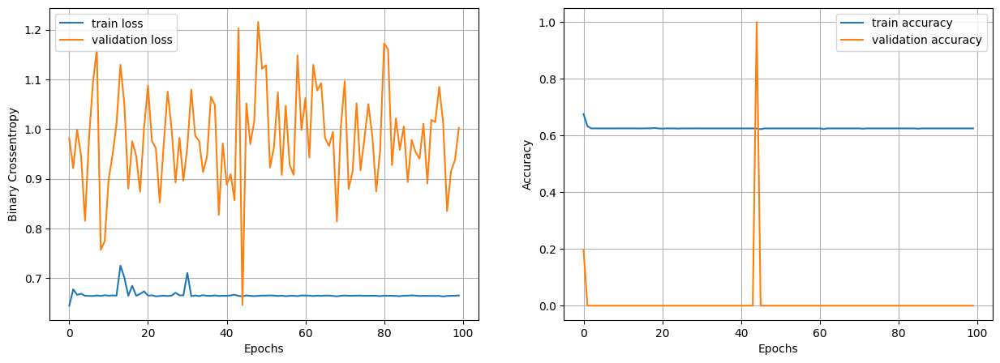

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6635 - loss: 0.6407  
Epoch 1/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7284 - loss: 0.6081 - val_accuracy: 0.1885 - val_loss: 0.7082
Epoch 2/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6684 - loss: 0.6246 - val_accuracy: 0.0000e+00 - val_loss: 1.0016
Epoch 3/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6213 - loss: 0.6668 - val_accuracy: 0.0000e+00 - val_loss: 1.0555
Epoch 4/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6309 - loss: 0.6621 - val_accuracy: 0.0000e+00 - val_loss: 0.9954
Epoch 5/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6302 - loss: 0.7275 - val_accuracy: 0.0000e+00 - val_loss: 1.0834
Epoch 6/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6293 - loss: 0.6619 - val_accuracy: 0.0000e+00 - val_loss: 0.9113
Epoch 7/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.6201 - loss: 0.6674 - val_accuracy: 0.0000e+00 - val_loss: 0.9

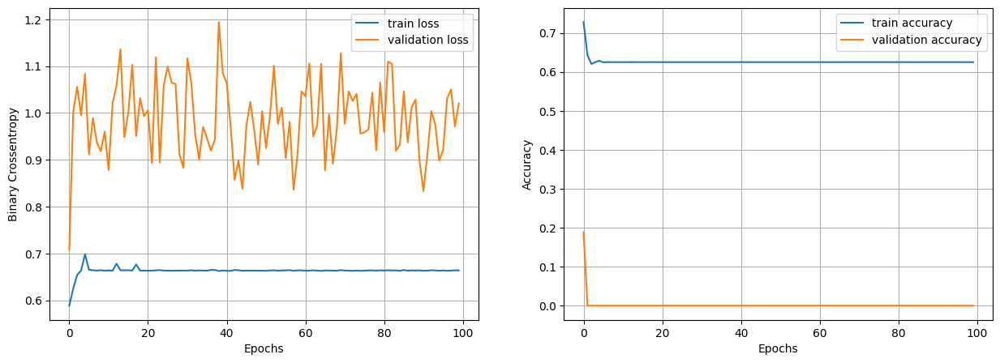

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6635 - loss: 0.6399
Epoch 1/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7216 - loss: 0.6519 - val_accuracy: 0.3861 - val_loss: 0.8411
Epoch 2/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7804 - loss: 0.4796 - val_accuracy: 0.4571 - val_loss: 0.7392
Epoch 3/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7731 - loss: 0.4930 - val_accuracy: 0.3179 - val_loss: 0.8288
Epoch 4/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7395 - loss: 0.5881 - val_accuracy: 0.2791 - val_loss: 0.8580
Epoch 5/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7128 - loss: 0.6310 - val_accuracy: 0.1409 - val_loss: 0.9163
Epoch 6/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6842 - loss: 0.7314 - val_accuracy: 0.0149 - val_loss: 0.9898
Epoch 7/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6377 - loss: 0.7437 - val_accuracy: 0.0010 - val_loss: 0.9918
Epoch 8/100
185/185 ━━

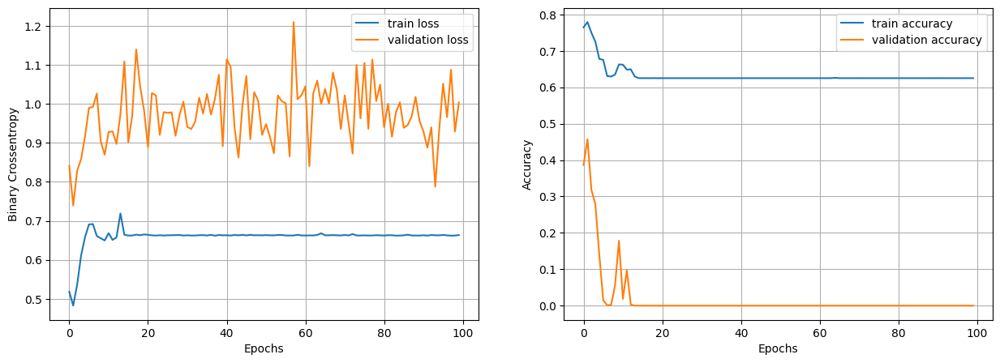

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6635 - loss: 0.6407
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7555 - loss: 0.5922 - val_accuracy: 0.6321 - val_loss: 0.6329
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8060 - loss: 0.4335 - val_accuracy: 0.6676 - val_loss: 0.5665
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8132 - loss: 0.4207 - val_accuracy: 0.6571 - val_loss: 0.5462
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8136 - loss: 0.4236 - val_accuracy: 0.6426 - val_loss: 0.6385
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7960 - loss: 0.4724 - val_accuracy: 0.5294 - val_loss: 0.6624
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7044 - loss: 0.5520 - val_accuracy: 0.0743 - val_loss: 0.7426
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6930 - loss: 0.5435 - val_accuracy: 0.8463 - val_loss: 0.6079
Epoch 8/100
93/93 ━━━━━━━━━━━━━━━━━━

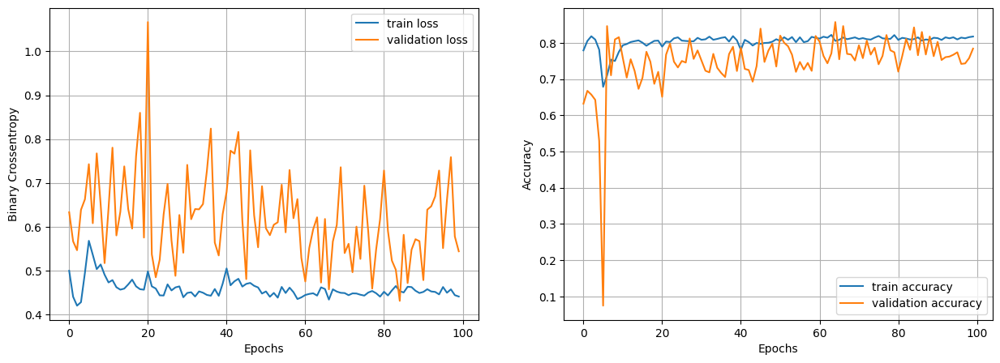

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8525 - loss: 0.3755
Epoch 1/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7988 - loss: 0.4408 - val_accuracy: 0.6939 - val_loss: 0.5849
Epoch 2/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8458 - loss: 0.3654 - val_accuracy: 0.6841 - val_loss: 0.5847
Epoch 3/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8508 - loss: 0.3457 - val_accuracy: 0.7591 - val_loss: 0.4541
Epoch 4/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8574 - loss: 0.3350 - val_accuracy: 0.7419 - val_loss: 0.4463
Epoch 5/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8558 - loss: 0.3421 - val_accuracy: 0.7264 - val_loss: 0.5234
Epoch 6/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8587 - loss: 0.3346 - val_accuracy: 0.7000 - val_loss: 0.5567
Epoch 7/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8512 - loss: 0.3502 - val_accuracy: 0.7118 - val_loss: 0.4828
Epoch 8/100
740/740 ━━

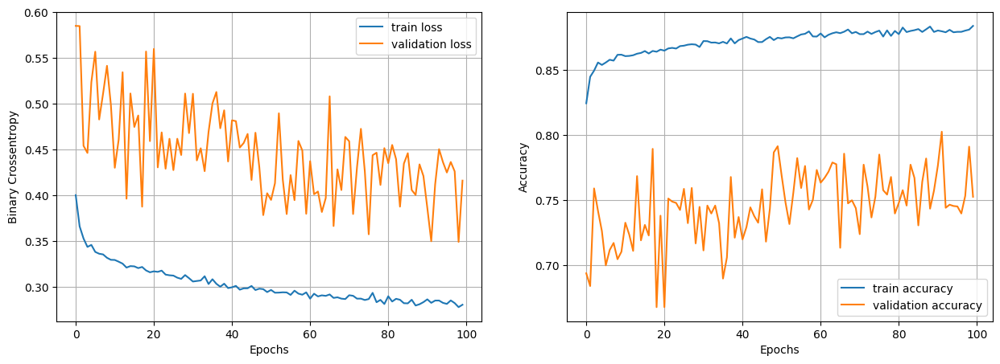

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8811 - loss: 0.3033
Epoch 1/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7939 - loss: 0.4502 - val_accuracy: 0.6865 - val_loss: 0.5603
Epoch 2/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8439 - loss: 0.3751 - val_accuracy: 0.7483 - val_loss: 0.4959
Epoch 3/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8532 - loss: 0.3515 - val_accuracy: 0.7199 - val_loss: 0.5077
Epoch 4/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8576 - loss: 0.3416 - val_accuracy: 0.7230 - val_loss: 0.4898
Epoch 5/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8547 - loss: 0.3385 - val_accuracy: 0.6882 - val_loss: 0.5556
Epoch 6/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8579 - loss: 0.3346 - val_accuracy: 0.7561 - val_loss: 0.4452
Epoch 7/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8657 - loss: 0.3273 - val_accuracy: 0.7179 - val_loss: 0.5125
Epoch 8/100
370/370 ━━

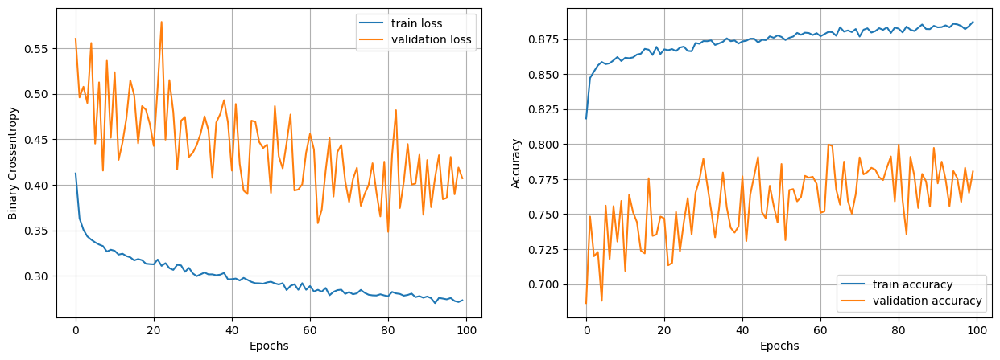

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8796 - loss: 0.3029
Epoch 1/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7913 - loss: 0.4518 - val_accuracy: 0.7203 - val_loss: 0.5260
Epoch 2/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8411 - loss: 0.3705 - val_accuracy: 0.7361 - val_loss: 0.4729
Epoch 3/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8513 - loss: 0.3545 - val_accuracy: 0.6983 - val_loss: 0.5829
Epoch 4/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8555 - loss: 0.3532 - val_accuracy: 0.7128 - val_loss: 0.5299
Epoch 5/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8632 - loss: 0.3322 - val_accuracy: 0.6686 - val_loss: 0.5835
Epoch 6/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8624 - loss: 0.3311 - val_accuracy: 0.7152 - val_loss: 0.5297
Epoch 7/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8608 - loss: 0.3309 - val_accuracy: 0.7037 - val_loss: 0.5254
Epoch 8/100
185/185 ━━

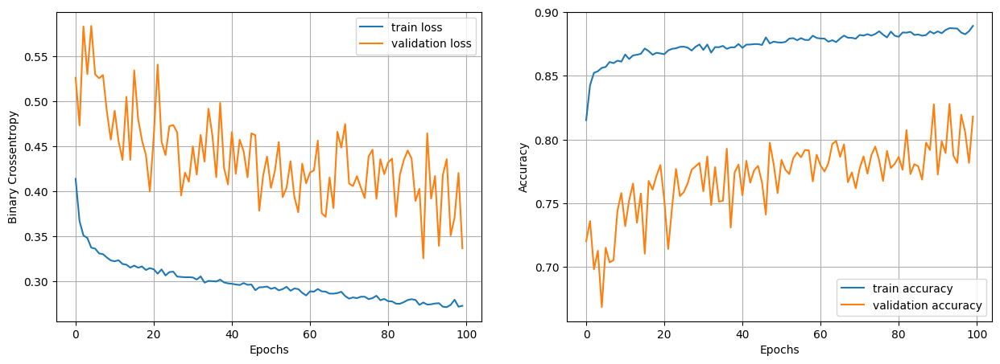

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8837 - loss: 0.2947
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7735 - loss: 0.4796 - val_accuracy: 0.7125 - val_loss: 0.5405
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8327 - loss: 0.3888 - val_accuracy: 0.7449 - val_loss: 0.5235
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8429 - loss: 0.3717 - val_accuracy: 0.7250 - val_loss: 0.5169
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8471 - loss: 0.3582 - val_accuracy: 0.6959 - val_loss: 0.5696
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8536 - loss: 0.3449 - val_accuracy: 0.7659 - val_loss: 0.4437
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8610 - loss: 0.3344 - val_accuracy: 0.7311 - val_loss: 0.4785
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8557 - loss: 0.3463 - val_accuracy: 0.7341 - val_loss: 0.4803
Epoch 8/100
93/93 ━━━━━━━━━━━━━━━━━━

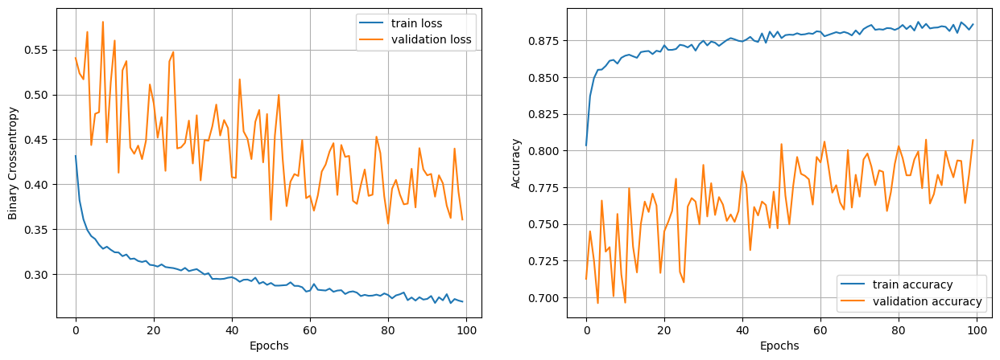

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8883 - loss: 0.3017
Epoch 1/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7685 - loss: 0.4926 - val_accuracy: 0.7432 - val_loss: 0.4833
Epoch 2/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8361 - loss: 0.3910 - val_accuracy: 0.6976 - val_loss: 0.5803
Epoch 3/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8449 - loss: 0.3656 - val_accuracy: 0.6922 - val_loss: 0.6355
Epoch 4/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8465 - loss: 0.3537 - val_accuracy: 0.7226 - val_loss: 0.5058
Epoch 5/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8529 - loss: 0.3466 - val_accuracy: 0.7311 - val_loss: 0.5061
Epoch 6/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8565 - loss: 0.3402 - val_accuracy: 0.7274 - val_loss: 0.5148
Epoch 7/100
740/740 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8551 - loss: 0.3369 - val_accuracy: 0.7118 - val_loss: 0.5387
Epoch 8/100
740/740 ━━

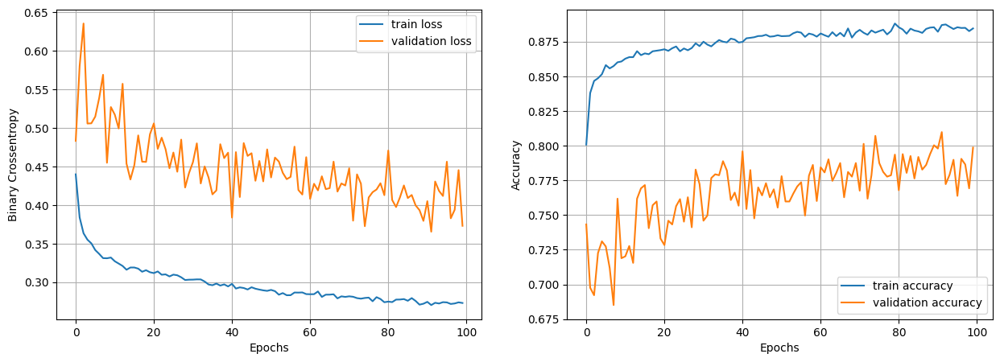

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8856 - loss: 0.2830  
Epoch 1/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7621 - loss: 0.5098 - val_accuracy: 0.6801 - val_loss: 0.5879
Epoch 2/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8256 - loss: 0.4031 - val_accuracy: 0.6726 - val_loss: 0.5967
Epoch 3/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8339 - loss: 0.3795 - val_accuracy: 0.6828 - val_loss: 0.6051
Epoch 4/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8426 - loss: 0.3767 - val_accuracy: 0.6878 - val_loss: 0.5983
Epoch 5/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8438 - loss: 0.3633 - val_accuracy: 0.6949 - val_loss: 0.5767
Epoch 6/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8524 - loss: 0.3526 - val_accuracy: 0.7486 - val_loss: 0.4850
Epoch 7/100
370/370 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8516 - loss: 0.3510 - val_accuracy: 0.7355 - val_loss: 0.4935
Epoch 8/100
370/370 

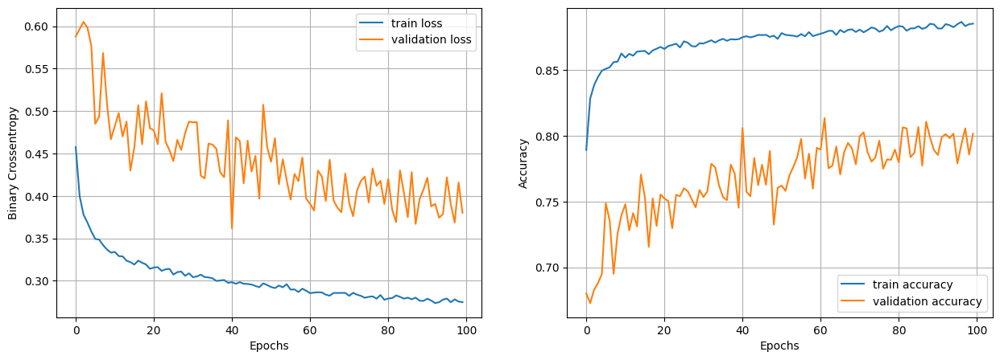

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8902 - loss: 0.2844
Epoch 1/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7135 - loss: 0.5592 - val_accuracy: 0.6439 - val_loss: 0.6087
Epoch 2/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8157 - loss: 0.4094 - val_accuracy: 0.6828 - val_loss: 0.5852
Epoch 3/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8274 - loss: 0.3973 - val_accuracy: 0.6669 - val_loss: 0.5999
Epoch 4/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8357 - loss: 0.3801 - val_accuracy: 0.7122 - val_loss: 0.5358
Epoch 5/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8473 - loss: 0.3676 - val_accuracy: 0.7108 - val_loss: 0.5453
Epoch 6/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8488 - loss: 0.3580 - val_accuracy: 0.7416 - val_loss: 0.5065
Epoch 7/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8489 - loss: 0.3569 - val_accuracy: 0.6838 - val_loss: 0.6146
Epoch 8/100
185/185 ━━

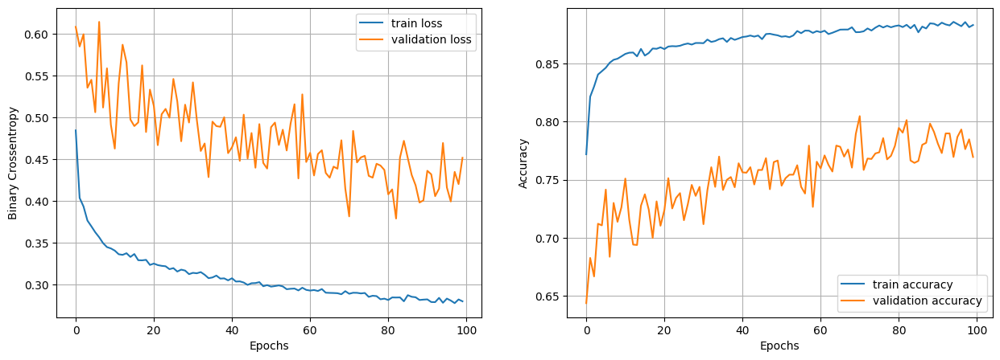

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8845 - loss: 0.2887  
Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7159 - loss: 0.5689 - val_accuracy: 0.6101 - val_loss: 0.6763
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7986 - loss: 0.4379 - val_accuracy: 0.6689 - val_loss: 0.5936
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8223 - loss: 0.4066 - val_accuracy: 0.6534 - val_loss: 0.6410
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8351 - loss: 0.3846 - val_accuracy: 0.6956 - val_loss: 0.5543
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8362 - loss: 0.3825 - val_accuracy: 0.7000 - val_loss: 0.5604
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8464 - loss: 0.3663 - val_accuracy: 0.7291 - val_loss: 0.5269
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8443 - loss: 0.3675 - val_accuracy: 0.7216 - val_loss: 0.5584
Epoch 8/100
93/93 ━━━━━━━━━━━━━━━━

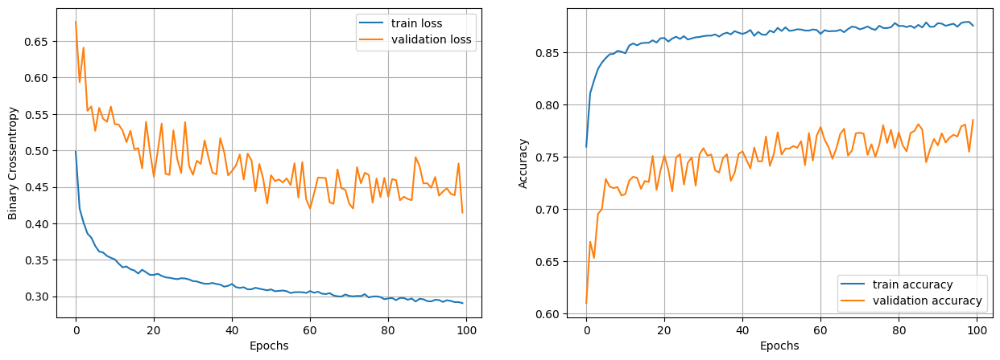

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8844 - loss: 0.2921


In [ ]:
least_val_loss = 1000
least_loss_model = None
epochs = 100
for num_nodes in [16, 32, 64]:
    for dropout_prob in [0, 0.2]:
        for lr in [0.1, 0.005, 0.001]:
            for batch_size in [16, 32, 64, 128]:
                nn_model, history = train_model(x_train,y_train,num_nodes,dropout_prob,lr,batch_size,epochs)
                print(f"num_nodes: {num_nodes}, dropout_prob: {dropout_prob}, lr: {lr}, batch_size: {batch_size}")
                plot_history(history)
                val_loss = nn_model.evaluate(x_valid, y_valid)
                if isinstance(val_loss, list):
                    val_loss_value = val_loss[0]
                else:
                    val_loss_value = val_loss
                if val_loss_value < least_val_loss:
                    least_val_loss = val_loss_value
                    least_loss_model = nn_model

In [ ]:
least_loss_model.predict(x_test)
y_pred = (y_pred > 0.5).astype(int).reshape(-1)

119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step


In [ ]:
y_pred

array([0, 1, 1, ..., 1, 0, 1])

In [ ]:
print(classification_report(y_test, y_pred, target_names=['hadron', 'gamma']))

              precision    recall  f1-score   support

      hadron       0.70      0.72      0.71      1350
       gamma       0.84      0.83      0.84      2454

    accuracy                           0.79      3804
   macro avg       0.77      0.77      0.77      3804
weighted avg       0.79      0.79      0.79      3804

